Environment: `velocity`

In [1]:
import scanpy
import anndata
import matplotlib
from matplotlib import pyplot
import hdf5plugin
import numpy
import scvelo
import seaborn
import pandas
import warnings
import cellrank
import gseapy
import decoupler
import IPython
import textwrap

import single_cell_analysis

In [2]:
# Scanpy plotting setup

scanpy.set_figure_params(dpi=300)

In [3]:
# Read input file
working_directory = "RNA Sequencing Data/"

# adata = scanpy.read_h5ad(working_directory + "/velocity_sdevelo.h5ad")

# Or read saved anndata objects
working_directory = "RNA Sequencing Data/"
base_name = "cellrank_version_5"
adata = scanpy.read_h5ad(
    working_directory+f"/{base_name}_anndata.h5ad"
)
driver_df = pandas.read_csv(
    working_directory+f"{base_name}_driver_genes.csv",
    index_col=0
)
combined_driver_df = pandas.read_csv(
    working_directory+f"{base_name}_driver_genes_combined.csv",
    index_col=0
)

In [4]:
# Read ChIP-seq targets
base_name = "ChIP Sequencing Data/chipseq_targets"

hic2_target_scores = pandas.read_csv(f"{base_name}_hic2_scores.csv", index_col=0)
klf4_hic2_target_scores = pandas.read_csv(f"{base_name}_klf4_hic2_scores.csv", index_col=0)
klf4_control_target_scores = pandas.read_csv(f"{base_name}_klf4_control_scores.csv", index_col=0)

hic2_targets = numpy.loadtxt(f"{base_name}_hic2_targets.txt", dtype=numpy.dtypes.StrDType)
klf4_hic2_targets = numpy.loadtxt(f"{base_name}_klf4_hic2_targets.txt", dtype=numpy.dtypes.StrDType)
klf4_control_targets = numpy.loadtxt(f"{base_name}_klf4_control_targets.txt", dtype=numpy.dtypes.StrDType)
klf4_targets = numpy.intersect1d(klf4_hic2_targets, klf4_control_targets)
shared_targets = numpy.intersect1d(hic2_targets, klf4_targets)

In [5]:
# Load bulk differential expression results

bulk_de = pandas.read_csv("RNA Sequencing Data/bulk_differential_expression_combined.csv", index_col=0)
bulk_metadata = pandas.read_csv("RNA Sequencing Data/bulk_sequencing_metadata.csv", index_col=0)
samples = bulk_metadata.index.to_list()
reprogramming_columns = bulk_de.columns[bulk_de.columns.str.contains("Reprogramming")]
reprogramming_de = pandas.read_csv("RNA Sequencing Data/bulk_differential_expression_reprogramming.csv", index_col=0)
mef_de = pandas.read_csv("RNA Sequencing Data/bulk_differential_expression_mef.csv", index_col=0)
mesc_de = pandas.read_csv("RNA Sequencing Data/bulk_differential_expression_mesc.csv", index_col=0)
ipsc_de = pandas.read_csv("RNA Sequencing Data/bulk_differential_expression_ipsc.csv", index_col=0)

In [6]:
# Variable genes and Cellrank drivers
variable_genes = adata.var_names.to_numpy()
variable_in_bulk = numpy.intersect1d(variable_genes, bulk_de.index.to_numpy())
stem_cell_drivers = driver_df.sort_values("Day 12 Control_corr", ascending=True).head(100).index.to_numpy()
dead_end_drivers = driver_df.sort_values("Day 12 Control_corr", ascending=False).head(100).index.to_numpy()
differentially_expressed_genes = reprogramming_de.loc[variable_in_bulk].query("padj < 0.05").index.to_numpy()

In [7]:
# Load list of transcription factors

tf_df = pandas.read_csv("ChIP Sequencing Data/Mus_musculus_TF.txt", sep="\t")
tf_array = tf_df["Symbol"].to_numpy()

# All target transcription factors
target_tfs = numpy.intersect1d(shared_targets, tf_array)

# Target transcription factors for which Hic2 changes expression significantly
de_target_tfs = numpy.intersect1d(target_tfs, differentially_expressed_genes)

de_dead_end_drivers = numpy.intersect1d(de_target_tfs, dead_end_drivers)
de_stem_cell_drivers = numpy.intersect1d(de_target_tfs, stem_cell_drivers)

In [8]:
genes_of_interest = de_dead_end_drivers.tolist() + de_stem_cell_drivers.tolist() + ["Klf4", "Myc", "Hic2", "Cdh1"]

In [9]:
# Show all possible libraries
names = gseapy.get_library_name(organism="Mouse")
print(names)

['ARCHS4_Cell-lines', 'ARCHS4_IDG_Coexp', 'ARCHS4_Kinases_Coexp', 'ARCHS4_TFs_Coexp', 'ARCHS4_Tissues', 'Achilles_fitness_decrease', 'Achilles_fitness_increase', 'Aging_Perturbations_from_GEO_down', 'Aging_Perturbations_from_GEO_up', 'Allen_Brain_Atlas_10x_scRNA_2021', 'Allen_Brain_Atlas_down', 'Allen_Brain_Atlas_up', 'Azimuth_2023', 'Azimuth_Cell_Types_2021', 'BioCarta_2013', 'BioCarta_2015', 'BioCarta_2016', 'BioPlanet_2019', 'BioPlex_2017', 'CCLE_Proteomics_2020', 'CM4AI_U2OS_Protein_Localization_Assemblies', 'COMPARTMENTS_Curated_2025', 'COMPARTMENTS_Experimental_2025', 'CORUM', 'COVID-19_Related_Gene_Sets', 'COVID-19_Related_Gene_Sets_2021', 'Cancer_Cell_Line_Encyclopedia', 'Carcinogenome', 'CellMarker_2024', 'CellMarker_Augmented_2021', 'ChEA_2013', 'ChEA_2015', 'ChEA_2016', 'ChEA_2022', 'Chromosome_Location', 'Chromosome_Location_hg19', 'ClinVar_2019', 'ClinVar_2025', 'DGIdb_Drug_Targets_2024', 'DSigDB', 'Data_Acquisition_Method_Most_Popular_Genes', 'DepMap_CRISPR_GeneDependency

Databases available in Decoupler: https://omnipathdb.org/info.html

In [10]:
# Load databases

collectri_df = decoupler.op.collectri(organism="mouse")
progeny_df = decoupler.op.progeny(organism="mouse")
hallmark_df = decoupler.op.hallmark(organism="mouse")

# Differential expression analysis with Scanpy

Scanpy uses a Wilcoxon rank sum test.

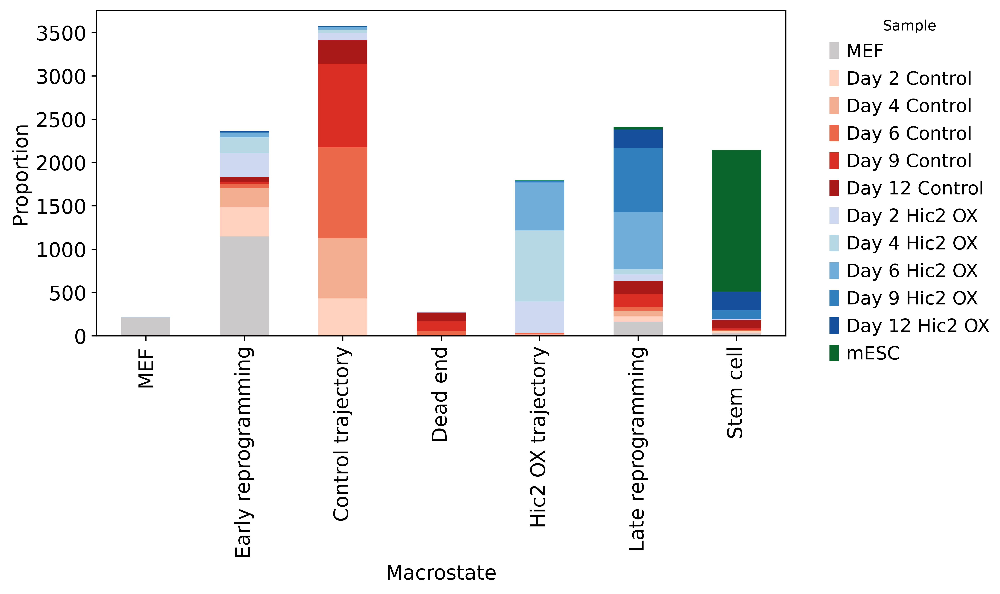

In [34]:
# Assign each cell to the most likely macrostate

macrostates = adata.uns["coarse_fwd"].obs["coarse_init_dist"].index.to_list()
macrostate_assignment = [macrostates[numpy.argmax(macrostate_probabilities)] for macrostate_probabilities in adata.obsm["macrostates_fwd_memberships"]]
adata.obs["macrostate"] = pandas.Categorical(macrostate_assignment)

# Rename macrostates
macrostate_name_dict = {
    "MEF": "MEF",
    "Day 2 Control": "Early reprogramming",
    "Day 4 Control": "Control trajectory",
    "Day 12 Control": "Dead end",
    "Day 4 Hic2 OX": "Hic2 OX trajectory",
    "Day 9 Hic2 OX": "Late reprogramming",
    "mESC": "Stem cell"
}
macrostates = macrostate_name_dict.values()
adata.obs["macrostate"] = adata.obs["macrostate"].cat.rename_categories(macrostate_name_dict)
adata.obs["macrostate"] = adata.obs["macrostate"].cat.reorder_categories(macrostates)

single_cell_analysis.plot_group_composition(adata, "macrostate")

# Define macrostate colors
adata.uns["macrostate_colors"] = [
    adata.uns["macrostates_fwd_colors"][0],
    adata.uns["macrostates_fwd_colors"][5],
    adata.uns["macrostates_fwd_colors"][2],
    adata.uns["macrostates_fwd_colors"][3],
    adata.uns["macrostates_fwd_colors"][4],
    adata.uns["macrostates_fwd_colors"][1],
    adata.uns["macrostates_fwd_colors"][6]
]

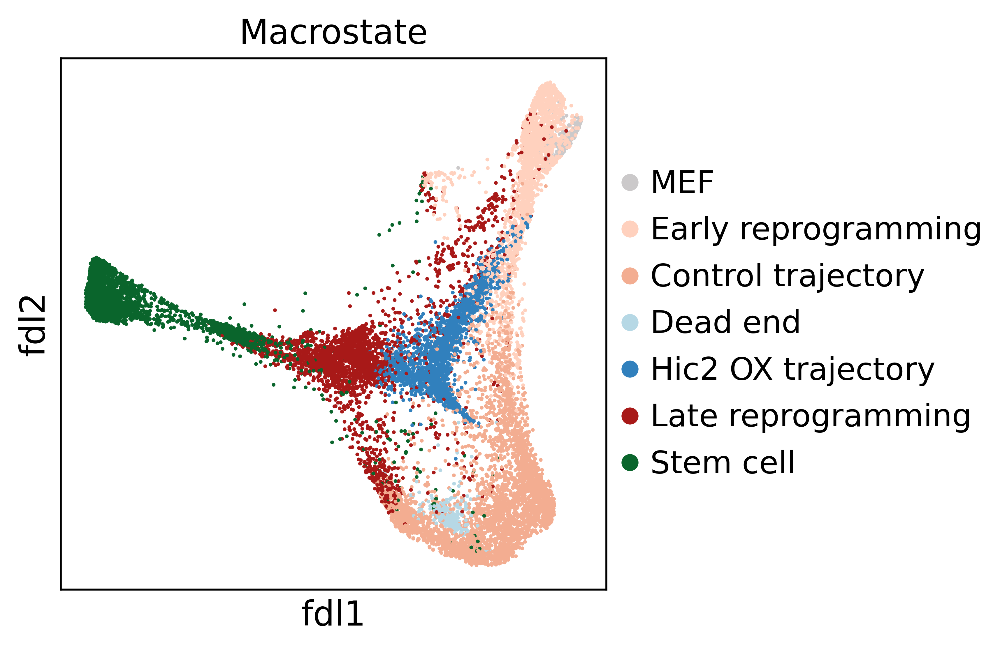

In [35]:
# Plot macrostates

scanpy.pl.embedding(adata, basis="fdl", color="macrostate", title="Macrostate")

# Comparison between macrostates

In [36]:
# Use the matrix layer with both spliced and unspliced

adata.layers["matrix"] = scanpy.pp.log1p(adata.layers["matrix"])

In [37]:
# perform differential expression using the standard wilcoxon rank-sum test

scanpy.tl.rank_genes_groups(
    adata,
    groupby="macrostate",
    method="wilcoxon",
    key_added="macrostate_rank_genes",
    layer="matrix",
    use_raw=False
)

rank_dfs = {}

# extract the results into a dataframe for a specific target macrostate
for macrostate in macrostates:
    rank_df = scanpy.get.rank_genes_groups_df(
        adata,
        key="macrostate_rank_genes",
        group=macrostate
    )
    rank_df.index = rank_df["names"]
    rank_df = rank_df.drop(columns="names")
    rank_dfs[macrostate] = rank_df

In [38]:
dead_end_drivers = ['Dmrtc2', 'Myc', 'Ovol1', 'Tlx2', 'Zbtb7c', 'Cdh1', "Hic2", "Klf4"]

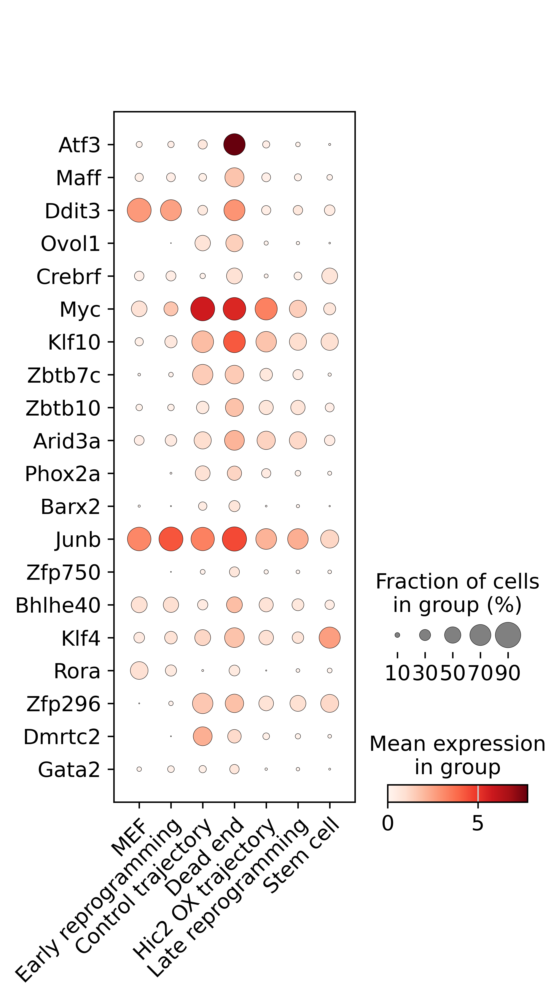

In [40]:
# Most upregulated transcription factors in dead end

top_tfs = rank_dfs["Dead end"].loc[numpy.intersect1d(tf_array, adata.var_names)].sort_values("scores", ascending=False).head(20)
axis = scanpy.pl.dotplot(adata, top_tfs.index, "macrostate", swap_axes=True, show=False)["mainplot_ax"]
axis.set_xticklabels(axis.get_xticklabels(), rotation=45, rotation_mode="anchor", ha="right")
figure = pyplot.gcf()
pyplot.show()


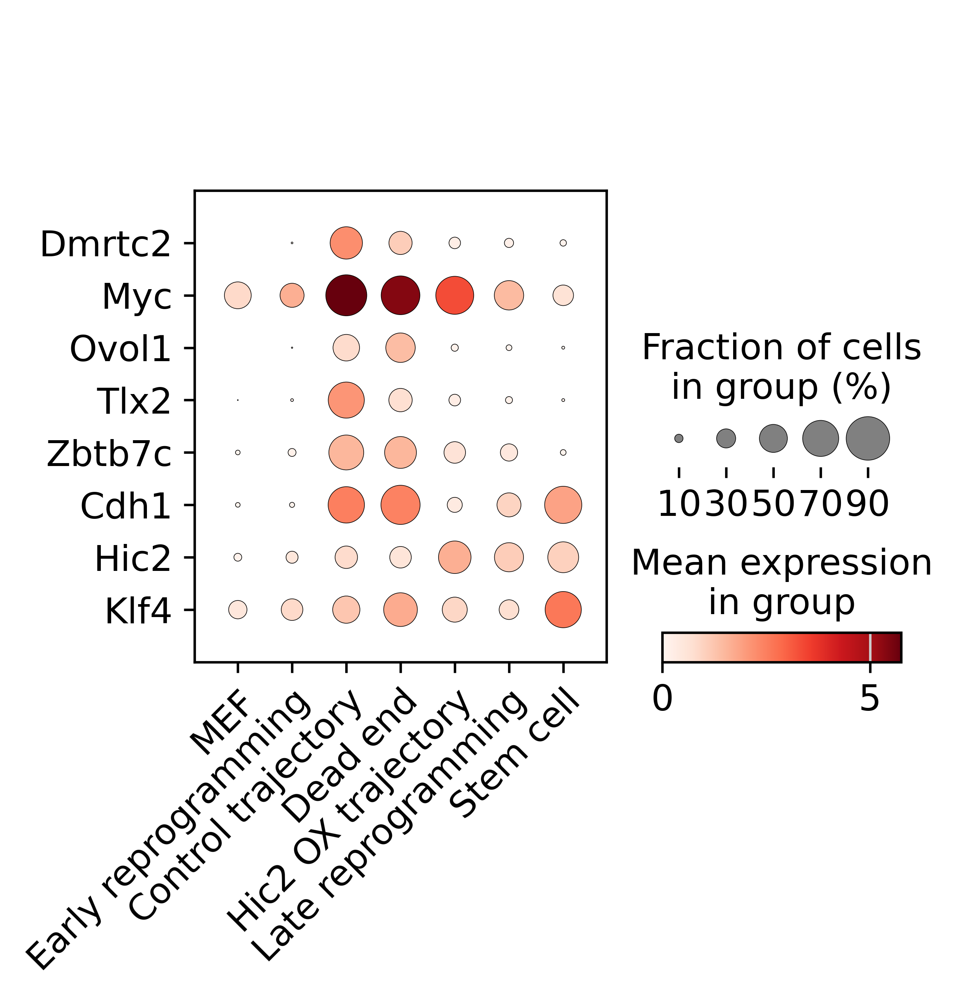

In [87]:
# Dead end driver dot plot

axis = scanpy.pl.dotplot(adata, dead_end_drivers, "macrostate", swap_axes=True, show=False)["mainplot_ax"]
axis.set_xticklabels(axis.get_xticklabels(), rotation=45, rotation_mode="anchor", ha="right")
figure = pyplot.gcf()
pyplot.show()

2026-03-11 14:57:23,442 [WARNING] Duplicated values found in preranked stats: 1.80% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-03-11 14:57:23,800 [WARNING] Duplicated values found in preranked stats: 0.10% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-03-11 14:57:24,166 [WARNING] Duplicated values found in preranked stats: 0.35% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-03-11 14:57:24,531 [WARNING] Duplicated values found in preranked stats: 2.60% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-03-11 14:57:24,896 [WARNING] Duplicated values found in preranked stats: 0.55% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-03-11 14:57:25,262 [WARNING] Duplicated values found in preranked stats: 0.15% of genes
The order of those genes will be

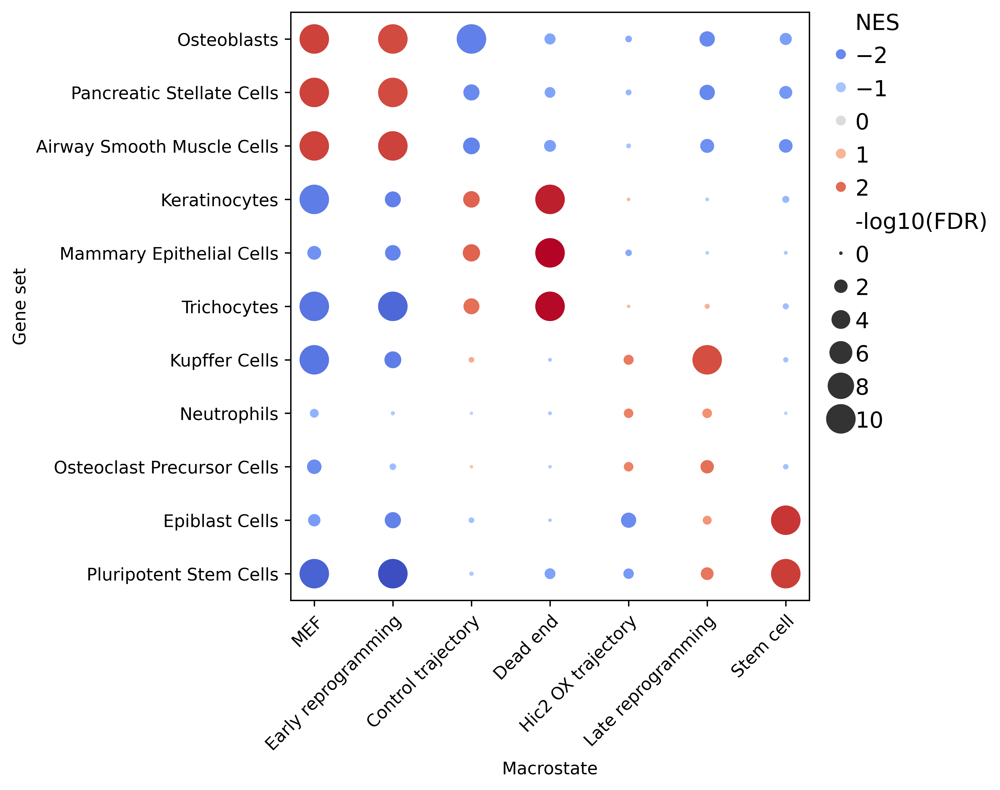

In [83]:
# Cell types

single_cell_analysis.compare_gsea(adata, gene_set="PanglaoDB_Augmented_2021", group_key="macrostate", n_top_terms=2, significance_cutoff=1)

2026-03-11 16:33:46,990 [WARNING] Duplicated values found in preranked stats: 1.80% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-03-11 16:33:47,340 [WARNING] Duplicated values found in preranked stats: 0.10% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-03-11 16:33:47,700 [WARNING] Duplicated values found in preranked stats: 0.35% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-03-11 16:33:48,061 [WARNING] Duplicated values found in preranked stats: 2.60% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-03-11 16:33:48,422 [WARNING] Duplicated values found in preranked stats: 0.55% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-03-11 16:33:48,785 [WARNING] Duplicated values found in preranked stats: 0.15% of genes
The order of those genes will be

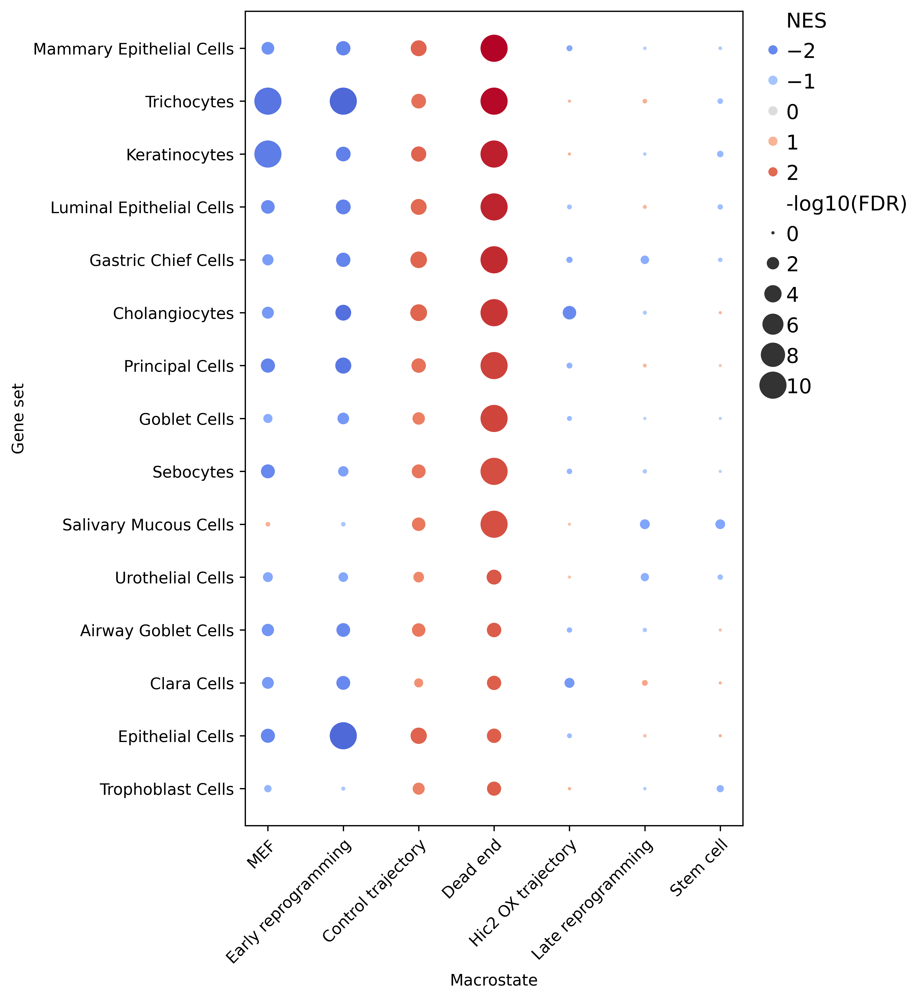

In [166]:
# Cell types in dead end

single_cell_analysis.compare_gsea(adata, gene_set="PanglaoDB_Augmented_2021", group_key="macrostate", top_from="Dead end", n_top_terms=15)

2026-03-11 14:20:21,742 [WARNING] Duplicated values found in preranked stats: 1.80% of genes
The order of those genes will be arbitrary, which may produce unexpected results.


MEF


2026-03-11 14:20:24,106 [WARNING] Duplicated values found in preranked stats: 0.10% of genes
The order of those genes will be arbitrary, which may produce unexpected results.


Early reprogramming


2026-03-11 14:20:26,588 [WARNING] Duplicated values found in preranked stats: 0.35% of genes
The order of those genes will be arbitrary, which may produce unexpected results.


Control trajectory


2026-03-11 14:20:29,050 [WARNING] Duplicated values found in preranked stats: 2.60% of genes
The order of those genes will be arbitrary, which may produce unexpected results.


Dead end


2026-03-11 14:20:31,534 [WARNING] Duplicated values found in preranked stats: 0.55% of genes
The order of those genes will be arbitrary, which may produce unexpected results.


Hic2 OX trajectory


2026-03-11 14:20:34,027 [WARNING] Duplicated values found in preranked stats: 0.15% of genes
The order of those genes will be arbitrary, which may produce unexpected results.


Late reprogramming


2026-03-11 14:20:36,516 [WARNING] Duplicated values found in preranked stats: 0.10% of genes
The order of those genes will be arbitrary, which may produce unexpected results.


Stem cell


/home/avesta/m26_losu/hic2_masters_project/single_cell_analysis.py:272: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axis.set_ylabel("Gene set", fontsize=font_size)


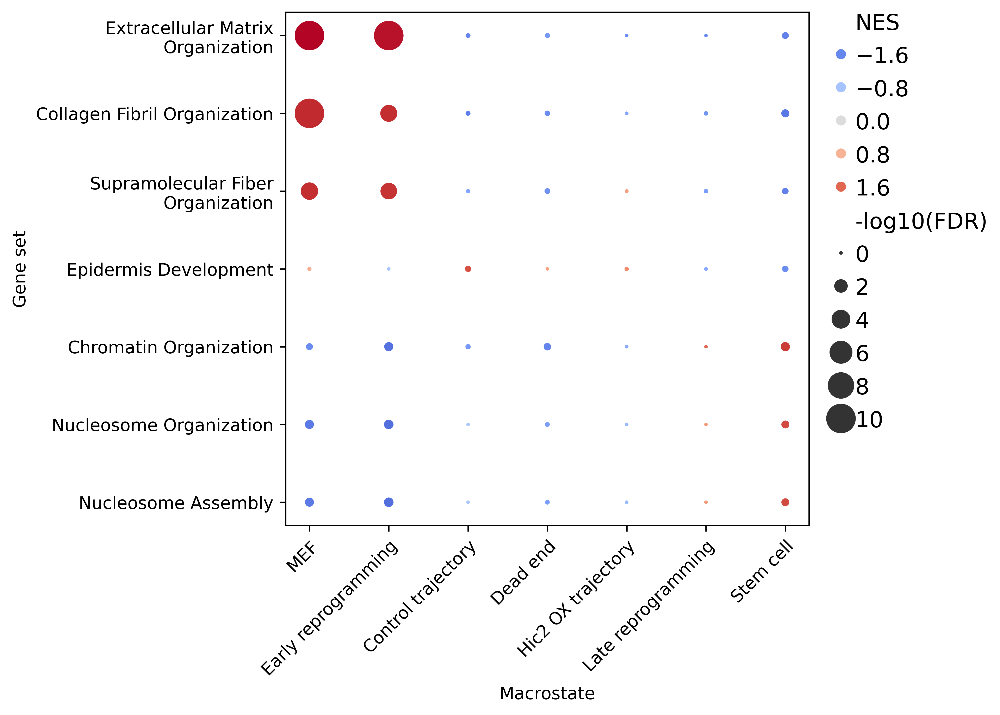

In [45]:
# GO terms

single_cell_analysis.compare_gsea(adata, gene_set="GO_Biological_Process_2025", group_key="macrostate", n_top_terms=3, top_from="all",
                                   qval_cutoff=0.5, remove_parenthesis = True)

2026-03-11 14:53:46,626 [WARNING] Duplicated values found in preranked stats: 1.80% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-03-11 14:53:49,045 [WARNING] Duplicated values found in preranked stats: 0.10% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-03-11 14:53:51,519 [WARNING] Duplicated values found in preranked stats: 0.35% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-03-11 14:53:53,990 [WARNING] Duplicated values found in preranked stats: 2.60% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-03-11 14:53:56,445 [WARNING] Duplicated values found in preranked stats: 0.55% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-03-11 14:53:58,898 [WARNING] Duplicated values found in preranked stats: 0.15% of genes
The order of those genes will be

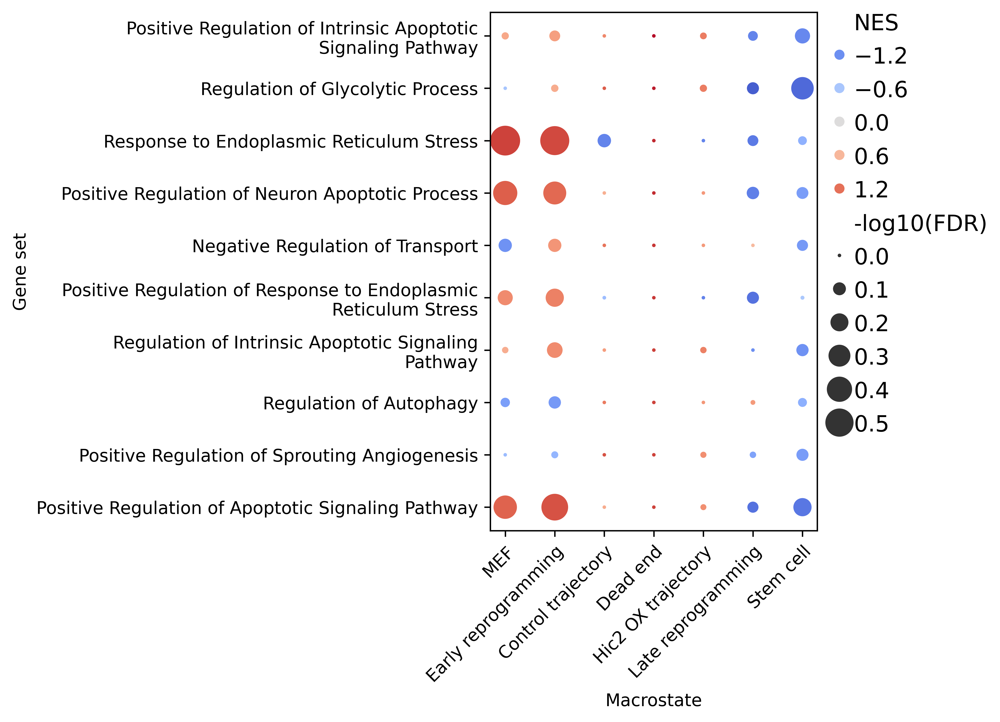

In [76]:
# GO terms in dead end

single_cell_analysis.compare_gsea(adata, gene_set="GO_Biological_Process_2025", group_key="macrostate", n_top_terms=10, top_from="Dead end",
                                   significance_cutoff=1, remove_parenthesis = True, wrap_width=50, sort_key="NES")

2026-03-11 14:47:58,009 [WARNING] Duplicated values found in preranked stats: 1.80% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-03-11 14:47:58,158 [WARNING] Duplicated values found in preranked stats: 0.10% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-03-11 14:47:58,315 [WARNING] Duplicated values found in preranked stats: 0.35% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-03-11 14:47:58,465 [WARNING] Duplicated values found in preranked stats: 2.60% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-03-11 14:47:58,614 [WARNING] Duplicated values found in preranked stats: 0.55% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-03-11 14:47:58,765 [WARNING] Duplicated values found in preranked stats: 0.15% of genes
The order of those genes will be

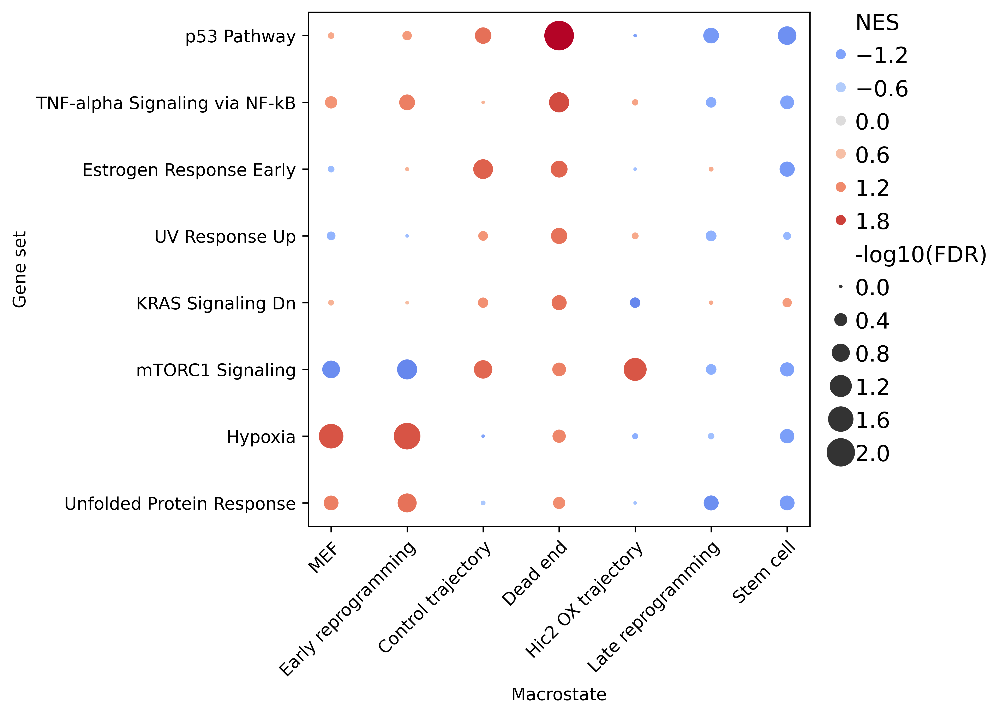

In [71]:
# Msig hallmarks in dead end

single_cell_analysis.compare_gsea(adata, gene_set="MSigDB_Hallmark_2020", group_key="macrostate", n_top_terms=10, top_from="Dead end",
                                   significance_cutoff=0.5, remove_parenthesis = True)

In [161]:
from importlib import reload

single_cell_analysis = reload(single_cell_analysis)

/home/avesta/m26_losu/hic2_masters_project/single_cell_analysis.py:388: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.


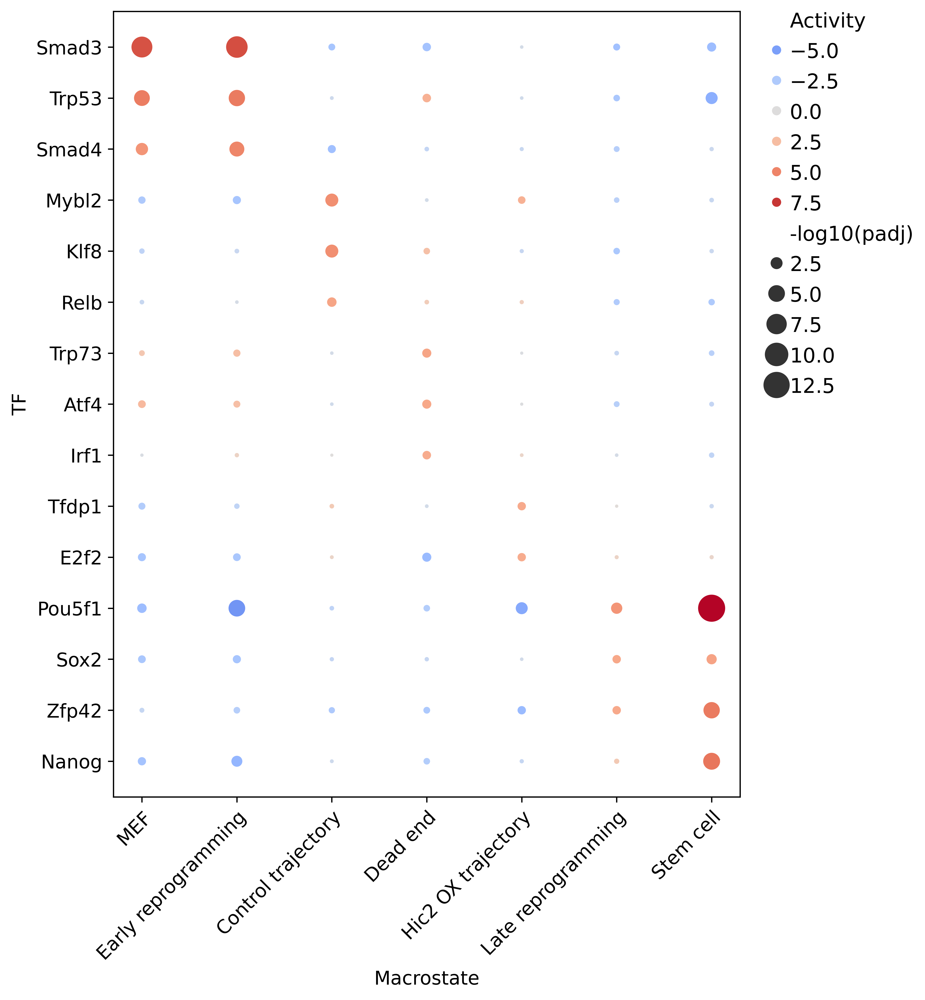

In [159]:
# Compare TFs in macrostates

single_cell_analysis.plot_tf_activity(adata, network=collectri_df, n_top = 3, activity_cutoff = 0, significance_cutoff = 0.1)

/home/avesta/m26_losu/hic2_masters_project/single_cell_analysis.py:378: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axis.set_ylabel("TF", fontsize=font_size)


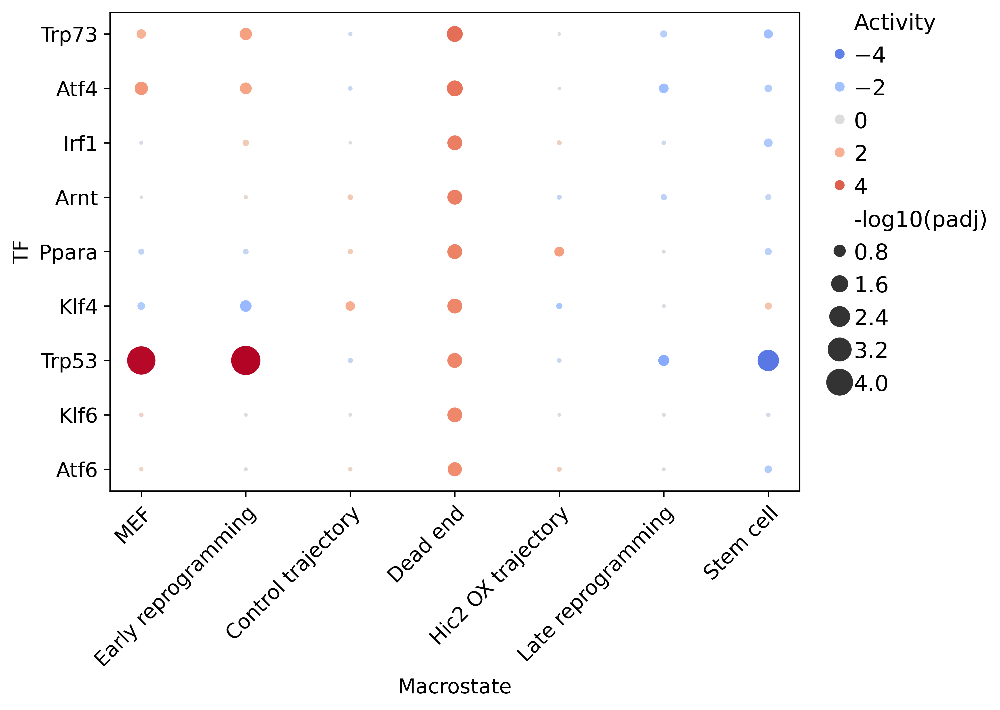

In [134]:
# TFs in dead end

single_cell_analysis.plot_tf_activity(adata, network=collectri_df, n_top = 20, top_from="Dead end", significance_cutoff=0.1, activity_cutoff=0)

/home/avesta/m26_losu/hic2_masters_project/single_cell_analysis.py:388: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.


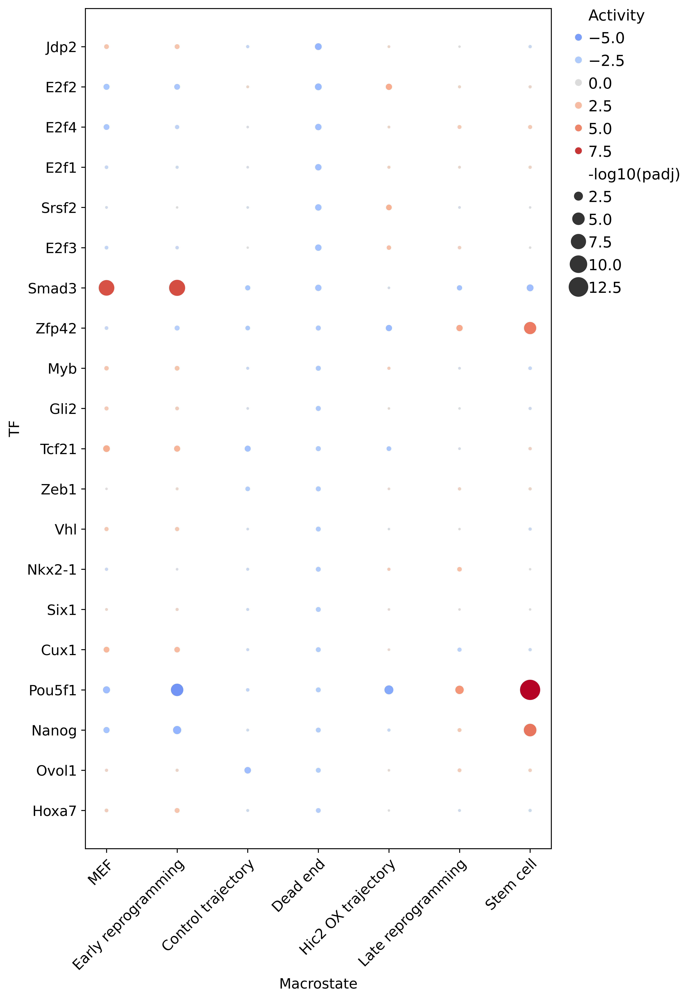

In [151]:
# TFs in dead end

single_cell_analysis.plot_tf_activity(adata, network=collectri_df, n_top = 20, top_from="Dead end", significance_cutoff=1, activity_cutoff=0, reverse=True)

/home/avesta/m26_losu/hic2_masters_project/single_cell_analysis.py:388: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axis.set_xticklabels(axis.get_xticklabels(), rotation=45, rotation_mode="anchor", ha="right")


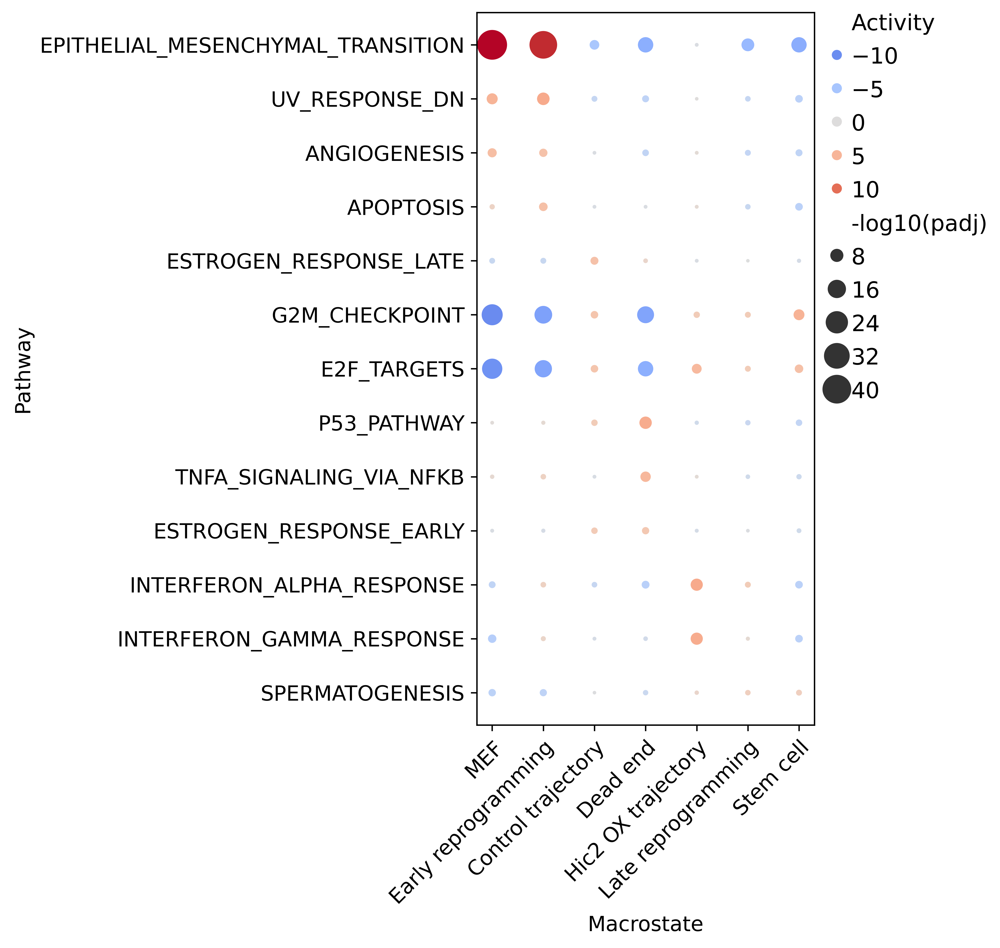

In [162]:
# Pathways in all macrostates

single_cell_analysis.plot_tf_activity(adata, network=hallmark_df, n_top = 3, activity_cutoff = 0, significance_cutoff = 0.1, pathway_key = "Pathway")

/home/avesta/m26_losu/hic2_masters_project/single_cell_analysis.py:388: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axis.set_xticklabels(axis.get_xticklabels(), rotation=45, rotation_mode="anchor", ha="right")


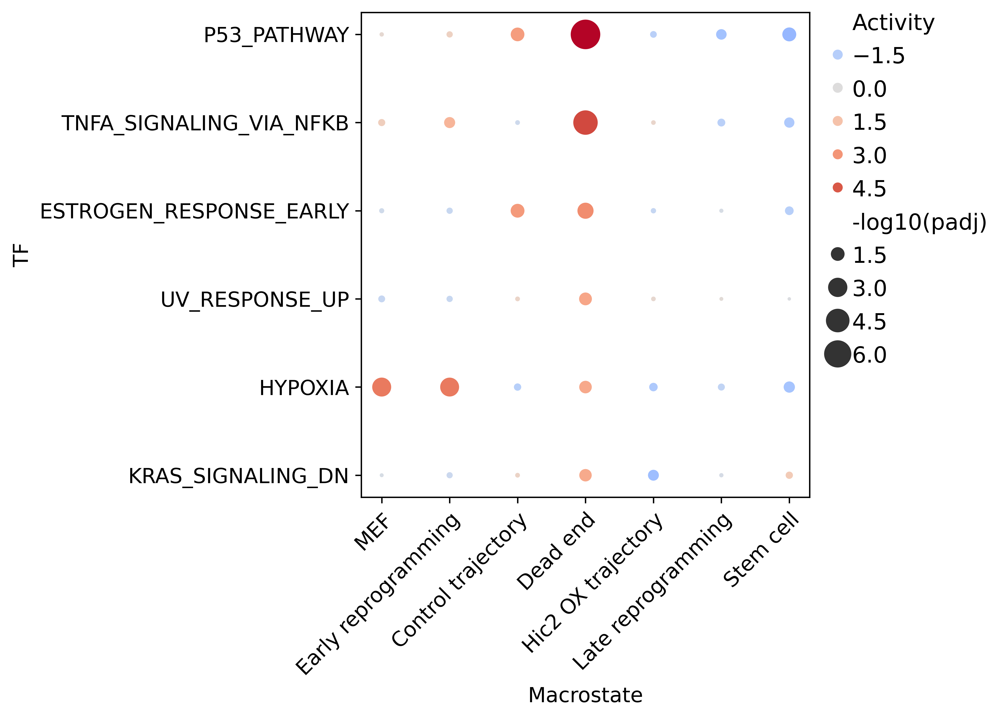

In [163]:
# Pathways in dead end

single_cell_analysis.plot_tf_activity(adata, network=hallmark_df, n_top = 10, top_from="Dead end", significance_cutoff=0.1, activity_cutoff=0)

## Dead end state

In [65]:
# Most upregulated genes

dead_end_rank_df = rank_dfs["Dead end"]
dead_end_rank_df.head(20)

,scores,logfoldchanges,pvals,pvals_adj
names,,,,
Zfas1,21.173996,0.832372,1.658761e-99,8.293804e-97
Aqp3,20.489449,3.021472,2.674038e-93,7.640108e-91
Snhg12,20.269077,1.361212,2.411342e-91,6.028354e-89
Snhg1,20.070787,0.822983,1.328829e-89,2.952953e-87
2410006H16Rik,20.032635,0.582968,2.861119e-89,5.722239e-87
1110038B12Rik,18.979704,0.733373,2.510075e-80,2.390548e-78
Atf3,18.565245,3.366064,6.140769e-77,5.117308e-75
Ppp1r15a,18.307306,1.523872,7.236202e-75,5.360150e-73
Dkkl1,18.150793,2.165016,1.265624e-73,9.040169e-72


In [274]:
# Most upregulated transcription factors in dead end

dead_end_rank_df.loc[numpy.intersect1d(tf_array, adata.var_names)].sort_values("scores", ascending=False).head(30)

,scores,logfoldchanges,pvals,pvals_adj
names,,,,
Atf3,18.565245,4.223915,6.140769e-77,5.117308e-75
Maff,13.679413,2.728795,1.347761e-42,2.542946e-41
Ddit3,11.394626,1.646957,4.447376e-30,4.834105e-29
Ovol1,11.081243,2.362402,1.547106e-28,1.539409e-27
Crebrf,9.362022,1.511920,7.822494e-21,5.249996e-20
Myc,9.019162,1.169086,1.895333e-19,1.155691e-18
Klf10,8.815069,1.339462,1.196115e-18,7.015336e-18
Zbtb7c,8.555893,1.329818,1.169595e-17,6.497752e-17
Zbtb10,8.534754,1.577673,1.404547e-17,7.738552e-17


Really exciting! The top three TFs are involved in stress response, suggesting that this macrostate corresponds to high activity of 

In [16]:
# Most upregulated transcription factors in dead end that are shared targets

dead_end_rank_df.loc[numpy.intersect1d(target_tfs, adata.var_names)].sort_values("scores", ascending=False).head(30)

,scores,logfoldchanges,pvals,pvals_adj
names,,,,
Ddit3,11.394626,1.646957,4.447376e-30,4.834105e-29
Ovol1,11.081243,2.362402,1.547106e-28,1.539409e-27
Myc,9.019162,1.169086,1.895333e-19,1.155691e-18
Klf10,8.815069,1.339462,1.196115e-18,7.015336e-18
Zbtb7c,8.555893,1.329818,1.169595e-17,6.497752e-17
Arid3a,7.838533,1.166667,4.558390e-15,2.135077e-14
Phox2a,6.612563,1.567374,3.777234e-11,1.381073e-10
Barx2,6.251344,2.200948,4.069344e-10,1.367847e-09
Junb,5.678843,0.691053,1.356086e-08,4.096938e-08


In [17]:
# Most downregulated transcription factors in dead end

dead_end_rank_df.loc[numpy.intersect1d(tf_array, adata.var_names)].sort_values("scores", ascending=True).head(30)

,scores,logfoldchanges,pvals,pvals_adj
names,,,,
Cenpa,-15.926634,-2.381851,4.140528e-57,1.562463e-55
Hmgb2,-15.657958,-2.191541,2.931616e-55,1.010902e-53
Terf1,-12.112407,-1.581593,9.079086e-34,1.113998e-32
Cdc5l,-11.929222,-1.162659,8.334891e-33,1.004204e-31
Jarid2,-11.119123,-1.892603,1.012631e-28,1.028052e-27
Tcf7l1,-11.116076,-2.095150,1.047792e-28,1.058376e-27
Id3,-10.884273,-3.022792,1.369875e-27,1.329976e-26
Prrx1,-9.897840,-3.690184,4.253618e-23,3.174342e-22
Nfib,-9.832184,-2.613001,8.182498e-23,6.016543e-22


In [86]:
dead_end_rank_df.loc[dead_end_drivers].sort_values("scores", ascending=False)

,scores,logfoldchanges,pvals,pvals_adj
names,,,,
Ovol1,11.081243,2.122284,1.547106e-28,1.539409e-27
Cdh1,10.455830,1.092228,1.377873e-25,1.187822e-24
Myc,9.019162,0.822836,1.895333e-19,1.155691e-18
Zbtb7c,8.555893,1.166626,1.169595e-17,6.497752e-17
Klf4,5.387359,0.596472,7.150038e-08,2.034150e-07
Dmrtc2,4.280212,0.767792,1.867150e-05,4.388131e-05
Tlx2,3.337677,0.509384,8.448178e-04,1.696421e-03
Hic2,-4.555451,-0.683143,5.227318e-06,1.276512e-05


In [18]:
dead_end_rank_df.loc[genes_of_interest].sort_values("scores", ascending=False)

,scores,logfoldchanges,pvals,pvals_adj
names,,,,
Ovol1,11.081243,2.362402,1.547106e-28,1.539409e-27
Cdh1,10.455830,1.275393,1.377873e-25,1.187822e-24
Myc,9.019162,1.169086,1.895333e-19,1.155691e-18
Zbtb7c,8.555893,1.329818,1.169595e-17,6.497752e-17
Klf4,5.387359,0.662667,7.150038e-08,2.034150e-07
Tlx2,3.337677,0.427623,8.448178e-04,1.696421e-03
Hic2,-4.555451,-0.839284,5.227318e-06,1.276512e-05
Zfp42,-8.510460,-1.906266,1.732442e-17,9.415448e-17
Rest,-9.763539,-1.143398,1.614218e-22,1.165500e-21


In [19]:
# Cell types in the dead end

pre_res = gseapy.prerank(
    rnk=dead_end_rank_df[["scores"]], 
    gene_sets="PanglaoDB_Augmented_2021",
    threads=32,
    min_size=5,
    max_size=1000
)
pre_res.res2d.sort_values("NES", ascending=False).head(20)

2026-03-11 09:29:18,306 [WARNING] Duplicated values found in preranked stats: 2.60% of genes
The order of those genes will be arbitrary, which may produce unexpected results.


,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes
0,prerank,Mammary Epithelial Cells,0.750473,2.784115,0.0,0.0,0.0,27/43,13.10%,S100a14;Krt17;Nectin4;Krt8;Mal2;Perp;Dsp;Lad1;...
1,prerank,Trichocytes,0.791982,2.745795,0.0,0.0,0.0,20/31,12.85%,S100a14;Krt17;Krt8;Perp;Dsp;Lad1;S100a16;Epha2...
2,prerank,Keratinocytes,0.71754,2.647798,0.0,0.0,0.0,17/41,10.60%,Aqp3;Lgals7;S100a14;Krt17;Nectin4;Perp;Lad1;Ov...
3,prerank,Luminal Epithelial Cells,0.728767,2.625749,0.0,0.0,0.0,19/40,6.85%,Aqp3;Crb3;S100a14;Nectin4;Krt8;Mal2;Perp;Dsp;B...
4,prerank,Gastric Chief Cells,0.853789,2.58431,0.0,0.0,0.0,11/19,6.85%,Crb3;S100a14;Mal2;Dsp;Lad1;Rab25;Spint1;Cdh1;S...
5,prerank,Cholangiocytes,0.739904,2.479739,0.0,0.0,0.0,14/28,6.85%,Crb3;S100a14;Krt8;Mal2;Lad1;Rab25;Ovol1;Cdh1;C...
6,prerank,Principal Cells,0.691432,2.374843,0.0,0.0,0.0,13/29,6.85%,Aqp3;S100a14;Mal2;Dsp;Lad1;Rab25;Ovol1;Cdh1;Cl...
7,prerank,Goblet Cells,0.75886,2.349223,0.0,0.0,0.0,9/20,6.60%,Aqp3;S100a14;Krt8;Lad1;Rab25;Cldn7;Misp;Pkp3;Gpx2
8,prerank,Sebocytes,0.669492,2.26761,0.0,0.0,0.0,18/31,12.85%,Aqp3;Crb3;Cxcl16;S100a14;Lad1;Rab25;Spint1;Ovo...
9,prerank,Salivary Mucous Cells,0.670843,2.242668,0.0,0.0,0.0,13/30,10.60%,Lgals7;S100a14;Krt17;Nectin4;Klk11;Nupr1;Pkp1;...


In [70]:
# MSig Hallmarks in dead end

pre_res = gseapy.prerank(
    rnk=dead_end_rank_df[["scores"]], 
    gene_sets="MSigDB_Hallmark_2020",
    threads=32,
    min_size=5,
    max_size=1000
)
pre_res.res2d.sort_values("NES", ascending=False).head(20)[["Term", "NES", "FDR q-val", "Lead_genes"]]

2026-03-11 14:45:19,689 [WARNING] Duplicated values found in preranked stats: 2.60% of genes
The order of those genes will be arbitrary, which may produce unexpected results.


,Term,NES,FDR q-val,Lead_genes
0,p53 Pathway,2.075701,0.006709,Atf3;Ppp1r15a;Krt17;Tob1;Ndrg1;Cdkn1a;Perp;Btg...
5,TNF-alpha Signaling via NF-kB,1.711742,0.099513,Atf3;Ppp1r15a;Gch1;Cdkn1a;Maff;Sqstm1;Btg1;Btg...
7,Estrogen Response Early,1.522256,0.203499,Aqp3;Tob1;Krt8;Lad1;Ablim1;Cldn7;Myc;Klf10;Klk...
10,KRAS Signaling Dn,1.409864,0.282886,Lgals7;Btg2;Alox12b;Pkp1
11,UV Response Up,1.40295,0.230781,Aqp3;Atf3;Gch1;Sqstm1;Btg1;Btg2
16,mTORC1 Signaling,1.278178,0.354819,Ppp1r15a;Ifrd1;Cdkn1a;Sqstm1;Btg2;Ddit3;Nupr1;...
18,Hypoxia,1.228128,0.378246,Atf3;Ppp1r15a;Ndrg1;Cdkn1a;Maff;Btg1;Ddit3;Dus...
21,Unfolded Protein Response,1.166642,0.445853,Atf3;Ddit4;Dnajb9;Vegfa;Chac1
26,Androgen Response,1.0829,0.588383,Krt8;Ndrg1;Sat1;Homer2;Zbtb10;Dnajb9
28,Estrogen Response Late,1.029079,0.6711,Tob1;Perp;Klk11;Cdh1;Homer2;St14;Lsr;Klk10;Pkp...


In [21]:
# GO biological process in dead end

pre_res = gseapy.prerank(
    rnk=dead_end_rank_df[["scores"]], 
    gene_sets="GO_Biological_Process_2025",
    threads=32,
    min_size=5,
    max_size=1000
)
pre_res.res2d.sort_values("NES", ascending=False).head(20)[["Term", "NES", "NOM p-val", "FWER p-val", "FDR q-val"]]

2026-03-11 09:29:18,880 [WARNING] Duplicated values found in preranked stats: 2.60% of genes
The order of those genes will be arbitrary, which may produce unexpected results.


,Term,NES,NOM p-val,FWER p-val,FDR q-val
0,Positive Regulation of Intrinsic Apoptotic Sig...,1.764157,0.015748,0.925,1.0
5,Regulation of Glycolytic Process (GO:0006110),1.683511,0.025362,0.994,1.0
8,Response to Endoplasmic Reticulum Stress (GO:0...,1.65293,0.023256,1.0,1.0
11,Positive Regulation of Neuron Apoptotic Proces...,1.628479,0.039568,1.0,1.0
19,Negative Regulation of Transport (GO:0051051),1.578522,0.056604,1.0,1.0
25,Positive Regulation of Response to Endoplasmic...,1.560622,0.072664,1.0,1.0
34,Regulation of Intrinsic Apoptotic Signaling Pa...,1.520577,0.065455,1.0,1.0
36,Regulation of Autophagy (GO:0010506),1.515056,0.030151,1.0,1.0
38,Positive Regulation of Sprouting Angiogenesis ...,1.513925,0.079848,1.0,1.0
41,Positive Regulation of Apoptotic Signaling Pat...,1.511549,0.063291,1.0,1.0


In [22]:
# TFs whose targets are upregulated in dead end, perturbation followed by expression
pre_res = gseapy.prerank(
    rnk=dead_end_rank_df[["scores"]], 
    gene_sets="TF_Perturbations_Followed_by_Expression",
    threads=32,
    min_size=5,
    max_size=1000
)
print("Top")
IPython.display.display(pre_res.res2d.sort_values("NES", ascending=False).head(20))
print("Bottom")
IPython.display.display(pre_res.res2d.sort_values("NES", ascending=True).head(20))

2026-03-11 09:29:21,316 [WARNING] Duplicated values found in preranked stats: 2.60% of genes
The order of those genes will be arbitrary, which may produce unexpected results.


Top


,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes
64,prerank,MYC OE MOUSE GSE55272 CREEDSID GENE 1822 DOWN,0.518425,1.984173,0.0,0.049139,0.054,15/50,10.95%,Lgals7;Krt17;Ly6g6c;Mal2;Perp;Dsp;Ovol1;Cdh1;M...
69,prerank,NR1I2 KO MOUSE GSE23780 CREEDSID GENE 2165 DOWN,0.682368,1.97006,0.0,0.028255,0.063,5/17,12.10%,Cdkn1a;Alox12b;Scara5;Pdlim4;Map4k1
207,prerank,GLI1 INHIBITION HUMAN GSE36855 CREEDSID GENE 6...,0.541882,1.833544,0.0,0.054871,0.171,9/33,3.85%,Snhg12;Snhg1;Atf3;Ppp1r15a;Gas5;Nrip3;Ddit3;Cr...
440,prerank,EGR4 KD HUMAN GSE40558 CREEDSID GENE 3030 UP,0.5022,1.672098,0.0,0.177103,0.545,8/25,15.20%,Cdkn1a;Rab25;Stmn4;Gdf15;Slc7a3;Cpm;Cldn6;Cd109
449,prerank,ARID3A KD MOUSE GSE56853 CREEDSID GENE 1337 UP,0.372524,1.667053,0.0,0.147579,0.56,40/142,10.25%,Aqp3;Crb3;Gch1;Nectin4;Krt8;Ndrg1;Mal2;Cdkn1a;...
464,prerank,MBD3 KD MOUSE GSE31008 CREEDSID GENE 1325 UP,0.403511,1.656857,0.0,0.13281,0.584,23/78,10.40%,Lgals7;Crb3;Cxcl16;S100a14;Mal2;Perp;Lad1;Cldn...
541,prerank,ZNF750 KD HUMAN GSE38039 CREEDSID GENE 204 DOWN,0.405577,1.603763,0.0,0.149872,0.712,17/53,10.20%,Ly6g6c;Alox12b;Nupr1;Crebrf;Sdcbp2;Mal;Cryab;K...
542,prerank,ZNF750 KD HUMAN GSE38039 CREEDSID GENE 2704 UP,0.405577,1.603763,0.0,0.149872,0.712,17/53,10.20%,Ly6g6c;Alox12b;Nupr1;Crebrf;Sdcbp2;Mal;Cryab;K...
604,prerank,XBP1 KO MOUSE GSE52857 CREEDSID GENE 2765 UP,0.444003,1.564492,0.025,0.176626,0.789,13/33,12.25%,Atf3;Ndrg1;Cdkn1a;Ddit3;Dusp1;Tnfrsf13c;Klf4;P...
641,prerank,HMGA2 OE MOUSE GSE24071 CREEDSID GENE 2563 DOWN,0.511021,1.5462,0.024272,0.183287,0.826,3/19,7.95%,Btg2;Tmbim1;Plbd1


Bottom


,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes
0,prerank,TAL1 KD JURKAT HUMAN GSE72299 RNASEQ DOWN,-0.869367,-2.277573,0.0,0.0,0.0,23/28,9.40%,Actb;Ptma;Hnrnpa3;Vim;Ccnb2;Lmnb1;Rrm2;Cdk1;Bi...
1,prerank,NFKB1 INACTIVATION HUMAN GSE20667 CREEDSID GEN...,-0.810358,-2.251586,0.0,0.0,0.0,26/41,9.35%,Actb;Tmsb4x;Gpx4;Ptma;Pfn1;Sh3bgrl3;Cfl1;Hnrnp...
2,prerank,RC3H1 SIRNA HEK293 HUMAN GSE68611 RNASEQ UP,-0.805604,-2.240093,0.0,0.0,0.0,33/47,12.30%,Tmsb10;Actb;Marcksl1;Pfn1;Cfl1;Tpm1;Hnrnpa3;Vi...
3,prerank,DNMT1 KO MOUSE GSE31626 CREEDSID GENE 1237 DOWN,-0.774569,-2.218226,0.0,0.0,0.0,40/56,16.35%,Tmsb10;Actb;Tmsb4x;Pfn1;Sh3bgrl3;Lgals1;Vim;Db...
4,prerank,YEATS2 SHRNA H1299 HUMAN GSE90781 RNASEQ DOWN,-0.757055,-2.195573,0.0,0.0,0.0,36/57,9.35%,Tmsb10;Actb;Ptma;Pfn1;Cfl1;Lgals1;Hnrnpa3;Vim;...
5,prerank,MYCN SHRNA SKNBE2 HUMAN GSE84389 RNASEQ DOWN,-0.74657,-2.186579,0.0,0.0,0.0,44/67,14.40%,Actb;Marcksl1;Ptma;Pfn1;Cfl1;Lgals1;Ccnb2;Msn;...
6,prerank,BNC2 SIRNA BT549 HUMAN GSE79586 RNASEQ UP,-0.733371,-2.170556,0.0,0.0,0.0,45/72,14.40%,Tmsb10;Tmsb4x;Gpx4;Ptma;Pfn1;Hnrnpa3;G3bp2;Vim...
7,prerank,MEIS2 KD KASUMI1 HUMAN GSE81328 RNASEQ UP,-0.772648,-2.169772,0.0,0.0,0.0,38/50,17.90%,Actb;Tmsb4x;Ptma;Hnrnpa3;G3bp2;Msn;Lmnb1;Hmgn2...
8,prerank,DNMT1 KO MOUSE GSE31626 CREEDSID GENE 1236 DOWN,-0.737688,-2.160985,0.0,0.0,0.0,38/65,16.35%,Tmsb10;Tmsb4x;Pfn1;Sh3bgrl3;Lgals1;Hnrnpa3;Vim...
9,prerank,E2F1 OE HUMAN GSE2715 CREEDSID GENE 1129 DOWN,-0.747874,-2.152584,0.0,0.0,0.0,40/58,13.95%,Actb;Ptma;Pfn1;Cfl1;Tpm1;Hnrnpa3;Vim;Ccnb2;Lmn...


In [23]:
# TFs whose targets are upregulated in dead end, Chea
pre_res = gseapy.prerank(
    rnk=dead_end_rank_df[["scores"]], 
    gene_sets="ChEA_2022",
    threads=32,
    min_size=5,
    max_size=1000
)
print("Top")
IPython.display.display(pre_res.res2d.sort_values("NES", ascending=False).head(30))
print("Bottom")
IPython.display.display(pre_res.res2d.sort_values("NES", ascending=True).head(20))

2026-03-11 09:29:24,868 [WARNING] Duplicated values found in preranked stats: 2.60% of genes
The order of those genes will be arbitrary, which may produce unexpected results.


Top


,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes
6,prerank,TP63 17297297 ChIP-ChIP HaCaT Human,0.572285,1.741691,0.005556,0.210702,0.168,11/20,13.40%,Cdkn1a;Perp;Ddit4;Mdm2;Notch1;Itgb4;Gpx2;Krt14...
64,prerank,NOTCH1 21737748 ChIP-Seq TLL Human,0.476199,1.430009,0.054945,0.715719,0.689,5/18,11.90%,Ppp1r15a;Myc;Phlda3;Dusp5;Hes1
81,prerank,FOXA1 33576154 ChIP-Seq Human HilarLN Prostate...,0.339172,1.391662,0.0,0.580082,0.753,18/84,9.15%,Atf3;Ifrd1;Krt8;Ndrg1;Mal2;Maff;Btg1;Dusp1;Nup...
95,prerank,RELB 30642670 ChIP-Seq CTB1 Human Placenta Inf...,0.408139,1.370155,0.058394,0.491639,0.797,10/33,10.85%,Ppp1r15a;Tob1;Cdkn1a;Dusp1;Ddit4;Bhlhe40;Nfkbi...
121,prerank,HCFC1 20581084 ChIP-Seq MESCs Mouse,0.615534,1.340262,0.144828,0.457748,0.853,2/6,1.25%,Ifrd1;Tmem43
226,prerank,PKCTHETA 26484144 Chip-Seq BREAST Human,0.327009,1.212847,0.111111,0.790784,0.971,10/52,5.85%,Bbc3;Tob1;Tmem43;Rassf1;Btg2;Ddit4;Plk2;Myc;Kl...
228,prerank,NFE2L2 22581777 ChIP-Seq LYMPHOBLASTOID Human,0.299055,1.212498,0.130435,0.67893,0.971,15/66,8.20%,Cdkn1a;Aldh3a1;Zfand5;Ablim1;Dlgap1;Dusp1;Trpv...
318,prerank,TP63 30713093 ChIP-Seq Epithelial Human Tongue...,0.247054,1.140678,0.25,0.89869,0.996,59/252,12.85%,Aqp3;Atf3;Ppp1r15a;Bbc3;S100a14;Krt17;Nectin4;...
326,prerank,STAT5A 28732065 ChIP-Seq J2E Mouse Blood,0.473337,1.135311,0.279167,0.825344,0.998,2/9,3.60%,Maff;Crebrf
329,prerank,ERG 21242973 ChIP-ChIP JURKAT Human,0.307776,1.133148,0.205607,0.752397,0.999,6/44,7.30%,Ndrg1;Rassf1;Cdh1;Cldn7;Trim47;Uap1l1


Bottom


,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes
0,prerank,FOXM1 23109430 ChIP-Seq U2OS Human,-0.762596,-2.124122,0.0,0.0,0.0,29/41,12.90%,Lgals1;Ccnb2;Lmnb1;Rrm2;Cenpa;Cdk1;Hmgb2;Pttg1...
1,prerank,E2F4 17652178 ChIP-ChIP JURKAT Human,-0.710901,-2.016648,0.0,0.0,0.0,31/52,11.75%,Nedd4;Ptma;Ccnb2;Lmnb1;Rrm2;Cenpa;Hmgb2;Hells;...
2,prerank,FOXM1 25889361 ChIP-Seq OE33 AND U2OS Human,-0.634503,-1.900569,0.0,0.0,0.0,47/78,21.35%,Lgals1;Ccnb2;Lmnb1;Rrm2;Cenpa;Cdk1;Hmgb2;Birc5...
3,prerank,EKLF 21900194 ChIP-Seq ERYTHROCYTE Mouse,-0.601792,-1.819891,0.0,0.000497,0.002,43/88,17.50%,Ptma;Pfn1;Ly6e;Sh3bgrl3;Cfl1;Lgals1;Vim;Dbi;Ms...
4,prerank,GABP 19822575 ChIP-Seq HepG2 Human,-0.60362,-1.798683,0.0,0.000995,0.005,37/79,18.40%,Actb;Marcksl1;Ptma;Cfl1;Tpm1;G3bp2;Tln1;Ppa1;P...
5,prerank,ELK1 19687146 ChIP-ChIP HELA Human,-0.613394,-1.770935,0.0,0.002155,0.013,30/62,20.60%,Nedd4;Tpm1;Dbi;Ccnb2;Csrp2;Prdx5;Serpinh1;Myl6...
7,prerank,FOXM1 26456572 ChIP-Seq MCF-7 Human BreastCancer,-0.590655,-1.729437,0.0,0.004689,0.032,34/65,17.85%,Ccnb2;Lmnb1;Rrm2;Cenpa;Cdk1;Hmgb2;Pttg1;Top2a;...
8,prerank,E2F4 21247883 ChIP-Seq LYMPHOBLASTOID Human,-0.542203,-1.72379,0.0,0.0046,0.036,75/176,18.75%,Marcksl1;Nedd4;Pfn1;Sh3bgrl3;Cfl1;Tpm1;Vim;Ccn...
9,prerank,RUNX2 24655370 ChIP-Seq MC3T3E1 Mouse Bone,-0.512459,-1.669786,0.0,0.013814,0.114,188/360,29.30%,Tmsb10;Actb;Pfn1;Ifitm3;Sh3bgrl3;Sparc;Tpm1;Hn...
10,prerank,MYC 28411283 ChIP-Seq MDA231-LM2-4175 Human Br...,-0.52641,-1.645659,0.0,0.019992,0.176,71/143,21.35%,Tmsb10;Actb;Gpx4;Ptma;Pfn1;Cfl1;G3bp2;Vim;Dbi;...


In [24]:
# TFs whose targets are upregulated in dead end, ENCODE
pre_res = gseapy.prerank(
    rnk=dead_end_rank_df[["scores"]], 
    gene_sets="ENCODE_TF_ChIP-seq_2015",
    threads=32,
    min_size=5,
    max_size=1000
)
print("Top")
IPython.display.display(pre_res.res2d.sort_values("NES", ascending=False).head(30))
print("Bottom")
IPython.display.display(pre_res.res2d.sort_values("NES", ascending=True).head(20))

2026-03-11 09:29:26,647 [WARNING] Duplicated values found in preranked stats: 2.60% of genes
The order of those genes will be arbitrary, which may produce unexpected results.


Top


,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes
20,prerank,NR2F2 MCF-7 hg19,0.445531,1.677474,0.0,0.143898,0.149,16/44,9.50%,Ifrd1;S100a14;Gch1;Gas5;Perp;Ddit3;Ovol1;Cstb;...
33,prerank,FOSL2 HepG2 hg19,0.454228,1.622799,0.0,0.113003,0.22,16/39,13.00%,Ppp1r15a;Ifrd1;Maff;Fam83g;Ddit3;Dusp1;Klf10;E...
42,prerank,ZEB1 HepG2 hg19,0.517477,1.597791,0.022099,0.090854,0.257,7/22,6.60%,Crb3;Mal2;Spint1;Nupr1;Cdh1;Lsr;Gpx2
54,prerank,MAX myocyte mm9,0.396932,1.57141,0.0,0.086551,0.312,26/69,10.80%,Snhg1;2410006H16Rik;1110038B12Rik;Ndrg1;Tmem43...
74,prerank,NFE2 K562 hg19,0.544524,1.517056,0.042553,0.101406,0.412,5/14,5.80%,Ppp1r15a;Ifrd1;Ankrd12;Dnajb9;Hexa
128,prerank,ATF3 K562 hg19,0.372298,1.446719,0.025316,0.132471,0.543,18/62,6.85%,Snhg12;Snhg1;Krt8;Tmem43;Gas5;Perp;Fam83g;Dpp7...
145,prerank,JUND MCF-7 hg19,0.424919,1.4324,0.044025,0.124067,0.565,12/27,13.15%,Ifrd1;Krt8;Fam83g;Spint1;Lsr;Hist1h2bc;Junb;Fo...
187,prerank,REST HeLa-S3 hg19,0.321971,1.384997,0.0,0.151305,0.675,16/102,4.30%,Snhg12;Snhg1;Bbc3;Krt17;Tob1;Krt8;Ndrg1;Tmem43...
195,prerank,YY1 GM12891 hg19,0.379903,1.376605,0.046154,0.142394,0.686,15/41,8.80%,Snhg12;Snhg1;Ppp1r15a;Gas5;Btg1;Zfand5;Tmbim1;...
199,prerank,PML MCF-7 hg19,0.364261,1.371456,0.011905,0.131709,0.695,19/54,9.15%,Snhg12;Snhg1;Ppp1r15a;Btg2;Zfand5;Dusp1;Cstb;S...


Bottom


,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes
0,prerank,E2F4 MEL cell line mm9,-0.757821,-2.064945,0.0,0.0,0.0,27/36,13.10%,Ptma;2810417H13Rik;H2afv;Lmnb1;Ccne1;Rrm2;Cdk1...
1,prerank,FOXM1 ECC-1 hg19,-0.672655,-2.031178,0.0,0.0,0.0,49/88,17.70%,Lgals1;H2afv;Ccnb2;Lmnb1;Rrm2;Cenpa;Cdk1;Hmgb2...
2,prerank,E2F4 HeLa-S3 hg19,-0.635248,-1.909244,0.0,0.000672,0.002,46/77,14.45%,H2afv;Lmnb1;Hmgn2;Ccne1;Rrm2;Cenpa;Cdk1;Hmgb2;...
3,prerank,E2F4 CH12.LX mm9,-0.605213,-1.859358,0.0,0.001261,0.005,64/99,21.85%,Ptma;Sh3bgrl3;Hnrnpa3;G3bp2;2810417H13Rik;H2af...
4,prerank,FOXM1 MCF-7 hg19,-0.70957,-1.845058,0.0,0.001412,0.007,18/29,12.35%,Ccnb2;Lmnb1;Cenpa;Cdk1;Hmgb2;Pttg1;Mki67;Cenpf...
5,prerank,NFYA GM12878 hg19,-0.59669,-1.841744,0.0,0.001177,0.007,59/111,22.05%,Actb;Gpx4;Ptma;Lgals1;Hnrnpa3;G3bp2;H2afv;Ccnb...
6,prerank,IRF3 HeLa-S3 hg19,-0.599086,-1.839793,0.0,0.001008,0.007,47/103,13.50%,Actb;Gpx4;Ptma;H2afv;Ccnb2;Lmnb1;Rrm2;Cenpa;Cd...
7,prerank,POLR2A erythroblast hg19,-0.616699,-1.823679,0.0,0.000882,0.007,42/70,28.50%,Marcksl1;Gpx4;Cfl1;Timp1;Ppa1;Cdk1;Top2a;Rrbp1...
8,prerank,SP2 H1-hESC hg19,-0.633683,-1.796132,0.0,0.001121,0.01,28/53,19.00%,Ptma;Cfl1;H2afv;Tln1;Cenpa;Myh10;Top2a;Actn1;R...
9,prerank,IRF3 GM12878 hg19,-0.588324,-1.793711,0.0,0.001109,0.011,51/100,21.35%,Actb;Gpx4;Ptma;Cfl1;G3bp2;Ccnb2;Rrm2;Tln1;Cenp...


In [25]:
# Motif enrichment analysis, TRANSFAC and JASPAR

# Motifs upregulated in dead end
pre_res = gseapy.prerank(
    rnk=dead_end_rank_df[["scores"]], 
    gene_sets="TRANSFAC_and_JASPAR_PWMs",
    threads=32,
    min_size=5,
    max_size=1000
)
print("Top")
IPython.display.display(pre_res.res2d.sort_values("NES", ascending=False).head(30))
print("Bottom")
IPython.display.display(pre_res.res2d.sort_values("NES", ascending=True).head(20))

2026-03-11 09:29:28,620 [WARNING] Duplicated values found in preranked stats: 2.60% of genes
The order of those genes will be arbitrary, which may produce unexpected results.


Top


,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes
3,prerank,MIR210 (human),0.558043,1.50005,0.068966,0.656543,0.518,3/12,2.05%,S100a14;Krt17;Aldh3a1
10,prerank,TCF3 (human),0.317273,1.38071,0.0,0.388584,0.717,32/136,10.55%,Aqp3;Crb3;Bbc3;Krt17;Gch1;Krt8;Ly6g6c;Mal2;Cdk...
11,prerank,SNAI1 (human),0.317273,1.38071,0.0,0.388584,0.717,32/136,10.55%,Aqp3;Crb3;Bbc3;Krt17;Gch1;Krt8;Ly6g6c;Mal2;Cdk...
16,prerank,SNAI2 (human),0.313749,1.365829,0.0,0.315563,0.746,32/137,10.55%,Aqp3;Crb3;Bbc3;Krt17;Gch1;Krt8;Ly6g6c;Mal2;Cdk...
50,prerank,MYOD1 (human),0.487151,1.21777,0.181435,0.495595,0.938,5/10,13.00%,Dlgap1;Renbp;Kiss1r;Fbxo32;Epcam
76,prerank,NCOA1 (human),0.512748,1.150754,0.25969,0.570239,0.979,2/7,8.75%,S100a14;Akap12
83,prerank,CEBPB (human),0.248756,1.138922,0.2,0.516224,0.984,33/160,11.50%,Ifrd1;S100a14;Krt8;Ndrg1;Mal2;Sqstm1;Rassf1;Al...
103,prerank,TFAP2C (human),0.248319,1.098064,0.181818,0.546581,0.991,27/165,8.80%,Aqp3;Cxcl16;Sqstm1;Ahnak2;Rassf1;Aldh3a1;Nrip3...
133,prerank,MIB2 (human),0.242075,1.041006,0.25,0.64381,0.997,35/165,9.90%,Lgals7;Bbc3;Cxcl16;Krt17;Perp;Sqstm1;Rassf1;Fa...
158,prerank,STAT1 (mouse),0.418552,0.99429,0.410156,0.720215,1.0,2/8,8.05%,Ly6g6c;Klf4


Bottom


,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes
0,prerank,HNF1B (human),-0.777747,-1.699551,0.002628,0.055541,0.054,5/12,5.70%,Sparc;Aes;Cald1;Gpx1;Spp1
1,prerank,Nkx2-5 (mouse),-0.573015,-1.57986,0.006803,0.178235,0.293,22/41,31.20%,Ly6e;Fn1;Ctgf;Pigp;Hsp90aa1;Ash2l;Fbxo15;Maged...
2,prerank,NRF1 (human),-0.508284,-1.507103,0.00426,0.339303,0.617,23/75,16.90%,Pfn1;G3bp2;Ppa1;Cdk1;Lrpap1;Maged1;Nt5dc2;Hmmr...
4,prerank,NFYA (mouse),-0.468782,-1.465386,0.0,0.434227,0.81,68/121,35.90%,Gpx4;Ccnb2;Msn;Hmgb2;Pttg1;Basp1;Top2a;Mki67;H...
5,prerank,EIF4EBP1 (human),-0.634248,-1.431476,0.055626,0.528949,0.925,8/14,21.10%,G3bp2;Rif1;Chd3;Brca1;Tdgf1;Zfhx4;Pla2g16;Plekhh2
6,prerank,FOXI1 (human),-0.625835,-1.422445,0.036709,0.48657,0.942,10/16,23.15%,Myh10;Nt5dc2;Ddah1;Terf1;Fam101b;Pigp;Sin3b;Ph...
7,prerank,SP4 (human),-0.662743,-1.418066,0.050715,0.438699,0.952,5/11,23.30%,Ccne1;Dpysl3;Ccnd1;Gadd45b;Ptk7
8,prerank,SP3 (mouse),-0.444168,-1.399976,0.005061,0.478533,0.972,64/162,30.10%,Ptma;Vim;Hmgn2;Serpinh1;Basp1;Ckap4;Nid1;Anxa3...
9,prerank,SRF (mouse),-0.459016,-1.398733,0.006257,0.431198,0.974,36/100,31.45%,Cenpa;Cdk1;Psme1;Hat1;Maged1;Nusap1;Col5a2;Fam...
12,prerank,CREB1 (mouse),-0.456186,-1.37876,0.020085,0.486132,0.985,41/81,32.40%,Sh3bgrl3;Cfl1;Calm1;Gsta4;Cenpa;Hmgb2;Selm;Dda...


In [84]:
# TF activity in dead end CollecTRI

data = dead_end_rank_df[["scores"]].T.dropna(axis=1)
tf_acts, tf_padj = decoupler.mt.ulm(data=data, net=collectri_df)
activities_df = pandas.DataFrame(data={"Activity": tf_acts.transpose()["scores"], "Adjusted p-value": tf_padj.transpose()["scores"]}, index=tf_acts.columns)
activities_df.sort_values("Activity", ascending=False).head(30)

,Activity,Adjusted p-value
Trp73,3.677934,0.041224
Atf4,3.574746,0.041224
Irf1,3.339589,0.061824
Arnt,3.319513,0.061824
Ppara,3.241119,0.061824
Klf4,3.164128,0.061824
Trp53,3.133736,0.061824
Klf6,3.107659,0.062696
Atf6,2.986856,0.081843
Spdef,2.729061,0.172994


In [27]:
# Most downregulated in dead end

activities_df.sort_values("Activity", ascending=True).head(25)

,Activity,Adjusted p-value
Jdp2,-3.744272,0.041224
E2f2,-3.574478,0.041224
E2f4,-3.252068,0.061824
E2f1,-3.223285,0.061824
Srsf2,-3.183484,0.061824
E2f3,-3.143399,0.061824
Smad3,-3.066711,0.067115
Zfp42,-2.640366,0.201222
Myb,-2.598681,0.201222
Gli2,-2.561578,0.201222


In [28]:
# Progeny pathways in dead end

data = dead_end_rank_df[["scores"]].T.dropna(axis=1)
tf_acts, tf_padj = decoupler.mt.ulm(data=data, net=progeny_df)
activities_df = pandas.DataFrame(data={"Activity": tf_acts.transpose()["scores"], "Adjusted p-value": tf_padj.transpose()["scores"]}, index=tf_acts.columns)

IPython.display.display(activities_df.sort_values("Activity", ascending=False))

,Activity,Adjusted p-value
p53,11.363184,6.809368e-28
Hypoxia,3.586051,1.604344e-03
NFkB,3.211456,4.695716e-03
Trail,2.705116,1.606742e-02
TNFa,2.392041,3.369376e-02
VEGF,2.219985,4.643041e-02
Androgen,1.248096,2.699991e-01
EGFR,0.959227,3.938203e-01
MAPK,0.177717,9.011127e-01
WNT,0.124272,9.011127e-01


In [29]:
# Hallmark pathways in dead end

data = dead_end_rank_df[["scores"]].T.dropna(axis=1)
tf_acts, tf_padj = decoupler.mt.ulm(data=data, net=hallmark_df)
activities_df = pandas.DataFrame(data={"Activity": tf_acts.transpose()["scores"], "Adjusted p-value": tf_padj.transpose()["scores"]}, index=tf_acts.columns)

print("Top")
IPython.display.display(activities_df.sort_values("Activity", ascending=False).head(20))
print("Bottom")
IPython.display.display(activities_df.sort_values("Activity", ascending=True).head(20))

Top


,Activity,Adjusted p-value
P53_PATHWAY,5.784466,8.255611e-08
TNFA_SIGNALING_VIA_NFKB,4.791014,1.454958e-05
ESTROGEN_RESPONSE_EARLY,3.211298,8.221997e-03
UV_RESPONSE_UP,2.507590,4.995757e-02
HYPOXIA,2.439448,5.577030e-02
KRAS_SIGNALING_DN,2.388846,5.947796e-02
UNFOLDED_PROTEIN_RESPONSE,2.081368,1.149273e-01
MTORC1_SIGNALING,1.494786,3.167677e-01
ESTROGEN_RESPONSE_LATE,1.447674,3.167677e-01
WNT_BETA_CATENIN_SIGNALING,1.361756,3.386796e-01


Bottom


,Activity,Adjusted p-value
G2M_CHECKPOINT,-8.176180,2.521730e-14
EPITHELIAL_MESENCHYMAL_TRANSITION,-7.315866,6.215788e-12
E2F_TARGETS,-7.311417,6.215788e-12
MITOTIC_SPINDLE,-6.413591,2.167250e-09
INTERFERON_ALPHA_RESPONSE,-3.524479,3.037050e-03
OXIDATIVE_PHOSPHORYLATION,-3.151398,8.977857e-03
UV_RESPONSE_DN,-2.990045,1.383483e-02
ANGIOGENESIS,-2.799698,2.300423e-02
GLYCOLYSIS,-2.356950,6.050429e-02
APICAL_JUNCTION,-2.030073,1.224464e-01


## Day 4 control

In [30]:
# Most upregulated transcription factors in day 4 control

control_rank_df.loc[numpy.intersect1d(tf_array, adata.var_names)].sort_values("scores", ascending=False).head(30)

,scores,logfoldchanges,pvals,pvals_adj
names,,,,
Tlx2,56.839550,4.274077,0.000000e+00,0.000000e+00
Dmrtc2,47.498425,3.894240,0.000000e+00,0.000000e+00
Hmgb3,45.477238,1.838411,0.000000e+00,0.000000e+00
Zbtb7c,44.280960,2.425463,0.000000e+00,0.000000e+00
Myc,40.487976,1.714621,0.000000e+00,0.000000e+00
Zbtb32,36.276093,2.216910,3.854943e-288,6.704248e-287
Ovol1,36.173790,3.394490,1.572881e-286,2.665901e-285
Hoxa9,29.866173,1.795005,5.413455e-196,5.916344e-195
Phox2a,29.071886,2.307154,8.140319e-186,8.181225e-185


In [31]:
# Cell types in control

pre_res = gseapy.prerank(
    rnk=control_rank_df[["scores"]], 
    gene_sets="PanglaoDB_Augmented_2021",
    threads=32,
    min_size=5,
    max_size=1000
)
pre_res.res2d.sort_values("NES", ascending=False).head(20)

2026-03-11 09:29:29,606 [WARNING] Duplicated values found in preranked stats: 0.35% of genes
The order of those genes will be arbitrary, which may produce unexpected results.


,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes
1,prerank,Keratinocytes,0.722683,2.065981,0.0,0.000847,0.001,24/41,18.70%,Lgals7;Perp;Anxa8;Lad1;Krt13;Itgb4;Gjb3;Pkp1;G...
3,prerank,Mammary Epithelial Cells,0.727149,2.059748,0.0,0.000424,0.001,19/43,9.50%,S100a16;Krt8;Perp;Dsp;Lad1;Itgb4;Gjb3;Misp;Krt...
4,prerank,Epithelial Cells,0.673628,2.053362,0.0,0.000282,0.001,37/67,21.10%,Krt8;Lad1;Crb3;Krt13;Itgb4;Gjb3;Gpx2;Misp;Dgat...
7,prerank,Gastric Chief Cells,0.841493,2.042796,0.0,0.000212,0.001,13/19,11.20%,Tppp3;Dsp;Lad1;Crb3;Itgb4;St14;Cdh1;S100a14;Ma...
8,prerank,Cholangiocytes,0.761258,2.024232,0.0,0.000169,0.001,16/28,11.20%,Krt8;Lad1;Crb3;Itgb4;Gpx2;Misp;St14;Cdh1;Ovol1...
11,prerank,Luminal Epithelial Cells,0.704064,1.983168,0.0,0.000424,0.003,26/40,18.50%,Krt8;Perp;Dsp;Lad1;Crb3;Cd9;Itgb4;Gjb3;Misp;St...
18,prerank,Hepatoblasts,0.784873,1.911555,0.0,0.000968,0.008,11/19,11.20%,Krt8;Dsp;Lad1;Cdh1;Krt14;S100a14;Mal2;Ahsg;Epc...
20,prerank,Trichocytes,0.711775,1.897653,0.0,0.001377,0.013,21/31,21.10%,S100a16;Krt8;Perp;Dsp;Lad1;Itgb4;Gjb3;Misp;Krt...
23,prerank,Principal Cells,0.696065,1.872906,0.0,0.001694,0.018,19/29,18.35%,Dsp;Lad1;Itgb4;Zbtb7c;Cdh1;Ovol1;S100a14;Mal2;...
25,prerank,Ductal Cells,0.679084,1.852394,0.0,0.002203,0.025,14/36,11.55%,S100a16;Krt8;Perp;Dsp;Lad1;Gpx2;Misp;Cdh1;S100...


In [32]:
# MSig Hallmarks in day 4 control

pre_res = gseapy.prerank(
    rnk=control_rank_df[["scores"]], 
    gene_sets="MSigDB_Hallmark_2020",
    threads=32,
    min_size=5,
    max_size=1000
)
pre_res.res2d.sort_values("NES", ascending=False).head(20)

2026-03-11 09:29:29,969 [WARNING] Duplicated values found in preranked stats: 0.35% of genes
The order of those genes will be arbitrary, which may produce unexpected results.


,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes
0,prerank,E2F Targets,0.635024,1.651825,0.004484,0.140315,0.127,15/28,19.60%,Hmgb3;Myc;Cdkn1a;Cdc20;Tfrc;Birc5;Pttg1;Aurka;...
1,prerank,Estrogen Response Late,0.556959,1.638242,0.0,0.081851,0.148,15/55,6.75%,Perp;Fabp5;Ccnd1;Homer2;Krt13;Cd9;Gjb3;Cd44;St...
2,prerank,G2-M Checkpoint,0.562461,1.568559,0.018362,0.145738,0.34,21/37,21.50%,Ccnd1;Hmgb3;Myc;Ncl;Cdc20;Birc5;Pttg1;Aurka;Br...
4,prerank,Myc Targets V1,0.887127,1.553158,0.013917,0.126335,0.389,4/5,8.75%,Myc;Cdc20;Ifrd1;Hsp90ab1
5,prerank,Estrogen Response Early,0.530287,1.544928,0.013441,0.110422,0.415,18/51,14.60%,Krt8;Ccnd1;Lad1;Tgm2;Krt13;Myc;Cd44;Klk10;Podx...
6,prerank,mTORC1 Signaling,0.544926,1.498328,0.027066,0.147772,0.564,16/36,17.85%,Ifi30;Tuba4a;Cd9;Ppa1;Cdkn1a;Nupr1;Tfrc;Ctsc;I...
7,prerank,Notch Signaling,0.696795,1.440732,0.065603,0.207132,0.735,5/9,16.85%,Ccnd1;Dtx2;Hes1;Dtx1;Notch1
9,prerank,p53 Pathway,0.472834,1.419216,0.031662,0.218607,0.796,14/60,7.50%,Ifi30;Perp;Itgb4;Gpx2;Pdgfa;Krt17;St14;Cdkn1a;...
10,prerank,Xenobiotic Metabolism,0.486033,1.371003,0.053571,0.281308,0.897,8/42,6.35%,Spint2;Psmb10;Aldh3a1;Fetub;Gsto1;Ddah2;Gch1;Pmm1
11,prerank,Wnt-beta Catenin Signaling,0.714086,1.363167,0.128623,0.267107,0.906,4/7,16.85%,Myc;Ccnd2;Lef1;Notch1


In [33]:
# TFs whose targets are affected in control
pre_res = gseapy.prerank(
    rnk=control_rank_df[["scores"]], 
    gene_sets="TF_Perturbations_Followed_by_Expression",
    threads=32,
    min_size=5,
    max_size=1000
)
print("Top")
IPython.display.display(pre_res.res2d.sort_values("NES", ascending=False).head(20)[["Term", "NES", "NOM p-val", "FWER p-val", "FDR q-val"]])
print("Bottom")
IPython.display.display(pre_res.res2d.sort_values("NES", ascending=True).head(20)[["Term", "NES", "NOM p-val", "FWER p-val", "FDR q-val"]])

2026-03-11 09:29:30,127 [WARNING] Duplicated values found in preranked stats: 0.35% of genes
The order of those genes will be arbitrary, which may produce unexpected results.


Top


,Term,NES,NOM p-val,FWER p-val,FDR q-val
1,IRF6 KO MOUSE GSE5800 CREEDSID GENE 153 UP,2.076655,0.0,0.0,0.0
3,OVOL2 OE MOUSE GSE55074 CREEDSID GENE 2603 DOWN,2.015563,0.0,0.005,0.002473
7,HSF1 KO MOUSE GSE41005 CREEDSID GENE 2143 DOWN,1.938822,0.0,0.014,0.004121
8,MYC OE MOUSE GSE55272 CREEDSID GENE 1822 DOWN,1.922255,0.0,0.024,0.005358
14,HNF4A MUT MOUSE GSE3116 CREEDSID GENE 850 DOWN,1.838971,0.0,0.173,0.031486
16,PPARA DEFICIENCY MOUSE GSE6864 CREEDSID GENE 6...,1.837654,0.0,0.175,0.02665
17,DOT1L INHIBITION HUMAN GSE29828 CREEDSID GENE ...,1.826377,0.0,0.215,0.028848
20,MYC KD HUMAN GSE22139 CREEDSID GENE 712 DOWN,1.798365,0.0,0.322,0.0408
28,YY1 KD MOUSE GSE31784 CREEDSID GENE 1333 UP,1.760211,0.0,0.517,0.071708
29,SP3 KD HUMAN GSE7102 CREEDSID GENE 1548 UP,1.759682,0.006289,0.52,0.065115


Bottom


,Term,NES,NOM p-val,FWER p-val,FDR q-val
0,MYC OE HUMAN GSE43730 CREEDSID GENE 359 DOWN,-2.170573,0.0,0.002,0.003045
2,GTF2I KO MOUSE GSE48790 CREEDSID GENE 1451 DOWN,-2.038413,0.0,0.014,0.010659
4,TCF21 SIRNA HCASMC HUMAN GSE44461 RNASEQ UP,-1.995597,0.0,0.025,0.012689
5,STAT6 KO MOUSE GSE25088 CREEDSID GENE 1160 DOWN,-1.980052,0.0,0.031,0.0118
6,TCF3 KO MOUSE GSE19923 CREEDSID GENE 2167 UP,-1.963087,0.0,0.043,0.013399
9,MYC KD HUMAN GSE22139 CREEDSID GENE 712 UP,-1.91025,0.0,0.09,0.024109
10,NEUROG3 OE MOUSE GSE3653 CREEDSID GENE 2290 DOWN,-1.905953,0.0,0.095,0.022187
11,NEUROD1 KO MOUSE GSE35396 CREEDSID GENE 3091 DOWN,-1.895083,0.0,0.116,0.024172
12,MTF2 KD MOUSE GSE16364 CREEDSID GENE 1355 UP,-1.850649,0.0,0.225,0.045003
13,SP3 DEFICIENCY MOUSE GSE9124 CREEDSID GENE 637 UP,-1.849689,0.0,0.225,0.040807


These results suggest that the control pathway has low Ovol2 activity, which is consistent with high Ovol1 activity as Ovol1 downregulates Ovol2.

In [34]:
# TF activity in day 4 control, CollecTRI

data = control_rank_df[["scores"]].T.dropna(axis=1)
tf_acts, tf_padj = decoupler.mt.ulm(data=data, net=collectri_df)
activities_df = pandas.DataFrame(data={"Activity": tf_acts.transpose()["scores"], "Adjusted p-value": tf_padj.transpose()["scores"]}, index=tf_acts.columns)
print("Top")
IPython.display.display(activities_df.sort_values("Activity", ascending=False).head(30))
print("Bottom")
IPython.display.display(activities_df.sort_values("Activity", ascending=True).head(30))

Top


,Activity,Adjusted p-value
Mybl2,4.638549,0.001041
Klf8,4.597788,0.001041
Relb,3.727648,0.030394
Kmt2a,2.739443,0.237495
Gtf2i,2.672009,0.268378
Sox17,2.577072,0.273432
Hnf4a,2.569119,0.273432
Kdm5b,2.535601,0.273432
Stat5a,2.470430,0.273432
Meis1,2.452241,0.273432


Bottom


,Activity,Adjusted p-value
Thrb,-3.606286,0.036517
Ovol1,-3.453577,0.051843
Atf3,-3.379263,0.056669
Smad4,-3.208894,0.088756
Tcf21,-3.166159,0.089962
Smad3,-2.893342,0.193261
Hdac1,-2.865240,0.193261
Pgr,-2.798528,0.216268
Zfp42,-2.609047,0.273432
Snai2,-2.541430,0.273432


In [35]:
# Hallmark pathways in day 4 control

data = control_rank_df[["scores"]].T.dropna(axis=1)
tf_acts, tf_padj = decoupler.mt.ulm(data=data, net=hallmark_df)
activities_df = pandas.DataFrame(data={"Activity": tf_acts.transpose()["scores"], "Adjusted p-value": tf_padj.transpose()["scores"]}, index=tf_acts.columns)

print("Top")
IPython.display.display(activities_df.sort_values("Activity", ascending=False).head(20))
print("Bottom")
IPython.display.display(activities_df.sort_values("Activity", ascending=True).head(20))

Top


,Activity,Adjusted p-value
ESTROGEN_RESPONSE_LATE,3.901367,0.002421
G2M_CHECKPOINT,3.581882,0.005261
E2F_TARGETS,3.527209,0.005261
MYC_TARGETS_V1,3.438835,0.005843
MTORC1_SIGNALING,3.353293,0.006643
ESTROGEN_RESPONSE_EARLY,2.858181,0.030134
P53_PATHWAY,2.795054,0.032087
ANDROGEN_RESPONSE,2.426850,0.075061
NOTCH_SIGNALING,2.130628,0.135737
WNT_BETA_CATENIN_SIGNALING,1.967047,0.185883


Bottom


,Activity,Adjusted p-value
EPITHELIAL_MESENCHYMAL_TRANSITION,-4.819766,0.000076
UV_RESPONSE_DN,-2.488583,0.070267
INTERFERON_ALPHA_RESPONSE,-2.290791,0.098353
HYPOXIA,-1.464766,0.412586
ADIPOGENESIS,-1.409280,0.420433
APICAL_JUNCTION,-1.356629,0.420433
KRAS_SIGNALING_UP,-1.340653,0.420433
COAGULATION,-1.133114,0.549377
BILE_ACID_METABOLISM,-0.971331,0.676815
OXIDATIVE_PHOSPHORYLATION,-0.896466,0.712842


## Other macrostates

### MEF

In [36]:
mef_rank_df.loc[numpy.intersect1d(target_tfs, adata.var_names)].sort_values("scores", ascending=False).head(20)

,scores,logfoldchanges,pvals,pvals_adj
names,,,,
Tcf4,19.998795,2.590618,5.642036e-89,3.640023e-87
Prrx1,18.253450,2.964929,1.942464e-74,5.045360e-73
Nfix,17.841389,2.600149,3.372133e-71,7.411281e-70
Snai2,17.516239,3.521714,1.077132e-68,2.132934e-67
Id3,17.299751,2.897396,4.724180e-67,8.589418e-66
Creb3l1,16.130186,2.673716,1.565483e-58,2.159288e-57
Twist1,15.334627,2.292310,4.488444e-53,5.015022e-52
Atf5,15.266075,1.886232,1.286898e-52,1.429887e-51
Ddit3,14.289132,2.072961,2.557789e-46,2.263530e-45


In [37]:
mef_rank_df.loc[genes_of_interest].sort_values("scores", ascending=False).head(20)

,scores,logfoldchanges,pvals,pvals_adj
names,,,,
Rest,-1.631985,-0.219501,1.026827e-01,1.453399e-01
Tcf7l1,-3.400084,-0.572603,6.736512e-04,1.194417e-03
Ovol1,-4.391957,-27.377142,1.123350e-05,2.244455e-05
Klf4,-5.711605,-1.279042,1.119157e-08,2.639522e-08
Myc,-5.842216,-1.177940,5.151113e-09,1.233800e-08
Tlx2,-6.349072,-6.790480,2.166184e-10,5.663226e-10
Zbtb7c,-7.430651,-3.568405,1.080644e-13,3.211423e-13
Hic2,-10.602694,-3.335025,2.895181e-26,1.307079e-25
Cdh1,-10.928850,-4.562824,8.390458e-28,4.024201e-27


In [38]:
# Cell types

pre_res = gseapy.prerank(
    rnk=mef_rank_df[["scores"]], 
    gene_sets="PanglaoDB_Augmented_2021",
    threads=32,
    min_size=5,
    max_size=1000
)
pre_res.res2d.sort_values("NES", ascending=False).head(20)

2026-03-11 09:29:33,720 [WARNING] Duplicated values found in preranked stats: 1.80% of genes
The order of those genes will be arbitrary, which may produce unexpected results.


,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes
1,prerank,Osteoblasts,0.723755,2.3916,0.0,0.0,0.0,69/100,22.80%,Col12a1;Col3a1;Mfap4;Col5a2;Col1a1;Col5a1;Bgn;...
2,prerank,Pancreatic Stellate Cells,0.740284,2.383519,0.0,0.0,0.0,64/82,22.80%,Col12a1;Col3a1;Mfap4;Col5a2;Col1a1;Col5a1;Bgn;...
3,prerank,Airway Smooth Muscle Cells,0.745298,2.374622,0.0,0.0,0.0,47/72,16.35%,Col12a1;Col3a1;Mfap4;Col5a2;Col1a1;Col5a1;Bgn;...
4,prerank,Chondrocytes,0.720487,2.366229,0.0,0.0,0.0,65/94,22.80%,Col12a1;Col3a1;Mfap4;Col5a2;Col1a1;Col5a1;Bgn;...
5,prerank,Mesangial Cells,0.70515,2.304889,0.0,0.0,0.0,66/100,22.95%,Col12a1;Col3a1;Mfap4;Col5a2;Col1a1;Col5a1;Bgn;...
6,prerank,Myofibroblasts,0.72982,2.299222,0.0,0.0,0.0,45/73,13.80%,Col12a1;Col3a1;Mfap4;Col5a2;Col1a1;Col5a1;Bgn;...
7,prerank,Hepatic Stellate Cells,0.703015,2.265811,0.0,0.0,0.0,58/84,22.80%,Col12a1;Col3a1;Mfap4;Col5a2;Col1a1;Col5a1;Bgn;...
8,prerank,Vascular Smooth Muscle Cells,0.720773,2.264332,0.0,0.0,0.0,54/72,22.95%,Col12a1;Col3a1;Mfap4;Col5a2;Col1a1;Col5a1;Bgn;...
9,prerank,Fibroblasts,0.661086,2.260827,0.0,0.0,0.0,89/145,24.55%,Cthrc1;Col12a1;Col3a1;Mfap4;Col5a2;Col1a1;Col5...
10,prerank,Smooth Muscle Cells,0.688282,2.254682,0.0,0.0,0.0,58/92,22.80%,Col12a1;Col3a1;Mfap4;Col5a2;Col1a1;Col5a1;Bgn;...


### Day 2 control

In [39]:
early_rank_df.loc[genes_of_interest].sort_values("scores", ascending=False).head(20)

,scores,logfoldchanges,pvals,pvals_adj
names,,,,
Tcf7l1,-6.212878,-0.357384,5.202298e-10,7.799548e-10
Klf4,-10.344735,-0.649924,4.421376e-25,7.937838e-25
Rest,-11.397713,-0.484721,4.292483e-30,8.168379e-30
Ovol1,-15.084112,-4.829878,2.060273e-51,4.614273e-51
Tlx2,-21.310589,-4.311698,9.054929e-101,2.731502e-100
Myc,-22.563280,-1.282579,9.946500e-113,3.208548e-112
Zbtb7c,-22.563583,-2.537292,9.878791e-113,3.191855e-112
Hic2,-27.304823,-1.717965,3.717682e-164,1.529910e-163
Cdh1,-38.651409,-4.407885,0.000000e+00,0.000000e+00


In [40]:
# Cell types

pre_res = gseapy.prerank(
    rnk=early_rank_df[["scores"]], 
    gene_sets="PanglaoDB_Augmented_2021",
    threads=32,
    min_size=5,
    max_size=1000
)
pre_res.res2d.sort_values("NES", ascending=False).head(20)

2026-03-11 09:29:34,122 [WARNING] Duplicated values found in preranked stats: 0.10% of genes
The order of those genes will be arbitrary, which may produce unexpected results.


,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes
3,prerank,Airway Smooth Muscle Cells,0.743718,2.37638,0.0,0.0,0.0,43/72,11.80%,Col1a1;Igfbp7;Col1a2;Col5a2;Serpinh1;Bgn;Cald1...
5,prerank,Osteoblasts,0.693835,2.299341,0.0,0.0,0.0,64/100,22.10%,Col1a1;Igfbp7;Col1a2;Col5a2;Bgn;Cald1;Sparc;Lo...
6,prerank,Pancreatic Stellate Cells,0.710816,2.291263,0.0,0.0,0.0,53/82,19.65%,Col1a1;Col1a2;Col5a2;Bgn;Cald1;Sparc;Lox;Fstl1...
7,prerank,Myoblasts,0.727277,2.263345,0.0,0.0,0.0,44/61,21.20%,Col1a1;Col1a2;Col5a2;Bgn;Cald1;Fstl1;Col3a1;Co...
8,prerank,Hepatic Stellate Cells,0.693251,2.263019,0.0,0.0,0.0,58/84,24.25%,Col1a1;Igfbp7;Col1a2;Col5a2;Bgn;Cald1;Sparc;Fs...
9,prerank,Myofibroblasts,0.702668,2.247299,0.0,0.0,0.0,52/73,24.25%,Col1a1;Col1a2;Col5a2;Bgn;Cald1;Sparc;Fstl1;Cdh...
10,prerank,Mesangial Cells,0.67617,2.236329,0.0,0.0,0.0,57/100,19.75%,Col1a1;Col1a2;Col5a2;Bgn;Cald1;Sparc;Fstl1;Cdh...
12,prerank,Fibroblasts,0.65715,2.22772,0.0,0.0,0.0,88/145,24.85%,Col1a1;Igfbp7;Col1a2;Col5a2;Serpinh1;Bgn;Sparc...
13,prerank,Chondrocytes,0.67712,2.226625,0.0,0.0,0.0,67/94,28.15%,Col1a1;Igfbp7;Col1a2;Col5a2;Bgn;Cald1;Sparc;Fs...
14,prerank,Pulmonary Vascular Smooth Muscle Cells,0.69418,2.196184,0.0,0.0,0.0,39/68,15.70%,Col1a1;Igfbp7;Col1a2;Col5a2;Bgn;Cald1;Sparc;Fs...


Still fibroblasts

### Day 4 Hic2 OX

In [41]:
hic2_rank_df.sort_values("scores", ascending=False).head(20)

,scores,logfoldchanges,pvals,pvals_adj
names,,,,
Krt20,50.282352,4.077736,0.000000e+00,0.000000e+00
Krtdap,49.702965,3.375408,0.000000e+00,0.000000e+00
Hbb-y,48.594818,3.627287,0.000000e+00,0.000000e+00
Ggh,39.160580,1.923176,0.000000e+00,0.000000e+00
Isg15,38.737007,2.931289,0.000000e+00,0.000000e+00
Oasl2,37.672520,2.266748,1.400195e-310,4.667317e-308
Bex1,37.209736,1.974654,4.749454e-303,1.356987e-300
Marcksl1,36.568050,1.459173,9.212481e-293,2.303120e-290
Uchl1,36.453285,2.077479,6.102255e-291,1.356057e-288


In [42]:
hic2_rank_df.loc[numpy.intersect1d(target_tfs, adata.var_names)].sort_values("scores", ascending=False).head(20)

,scores,logfoldchanges,pvals,pvals_adj
names,,,,
Hic2,29.853521,1.698729,7.901978e-196,4.389988e-194
Msc,28.341820,2.928724,1.055726e-176,3.839002e-175
Id2,26.305702,1.493934,1.650265e-152,4.460176e-151
Fosl1,25.676720,1.821912,2.127542e-145,5.253191e-144
Hmga2,22.352753,0.987657,1.135227e-110,2.082985e-109
Tcf7l2,17.807337,0.796149,6.198944e-71,6.230095e-70
Myc,15.534280,0.754010,2.033452e-54,1.517501e-53
Zfp36l1,12.856343,0.574097,7.923741e-38,4.170390e-37
Arid3a,12.570497,0.734934,3.067895e-36,1.537792e-35


In [43]:
hic2_rank_df.loc[genes_of_interest].sort_values("scores", ascending=False).head(20)

,scores,logfoldchanges,pvals,pvals_adj
names,,,,
Hic2,29.853521,1.698729,7.901978e-196,4.389988e-194
Myc,15.534280,0.754010,2.033452e-54,1.517501e-53
Zbtb7c,0.973720,-0.014162,3.301955e-01,4.200961e-01
Tcf7l1,-0.157335,-0.057016,8.749808e-01,9.303358e-01
Klf4,-4.205745,-0.369090,2.602236e-05,4.942518e-05
Ovol1,-7.203125,-1.442028,5.884783e-13,1.548627e-12
Tlx2,-8.403493,-1.273954,4.333912e-17,1.329421e-16
Rest,-10.198244,-0.487211,2.018885e-24,7.618435e-24
Jarid2,-14.557760,-1.000956,5.213815e-48,3.363752e-47


In [44]:
# Cell types

pre_res = gseapy.prerank(
    rnk=hic2_rank_df[["scores"]], 
    gene_sets="PanglaoDB_Augmented_2021",
    threads=32,
    min_size=5,
    max_size=1000
)
pre_res.res2d.sort_values("NES", ascending=False).head(20)

2026-03-11 09:29:34,524 [WARNING] Duplicated values found in preranked stats: 0.55% of genes
The order of those genes will be arbitrary, which may produce unexpected results.


,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes
3,prerank,Kupffer Cells,0.647897,1.783795,0.00299,0.086277,0.082,3/33,6.45%,Lgals9;Hck;Dok2
6,prerank,Neutrophils,0.645349,1.709399,0.004539,0.114893,0.194,4/27,6.60%,Mme;Hck;Dok2;Hdc
7,prerank,Osteoclast Precursor Cells,0.63386,1.682766,0.007452,0.111049,0.255,3/29,6.70%,Lgals9;Hck;Ifih1
8,prerank,Alveolar Macrophages,0.603611,1.664664,0.004348,0.105283,0.304,5/34,14.05%,Lgals9;Hck;Ifi30;Plet1;Mpp1
9,prerank,Monocytes,0.558385,1.651425,0.0,0.098407,0.347,9/51,8.80%,Lgals9;Hck;Ifi30;Rgs2;Ly6e;Ifit1;Vcan;Dok2;Rhoc
10,prerank,Noradrenergic Neurons,0.803058,1.504463,0.04817,0.406753,0.856,5/6,16.65%,Ddc;Fetub;Rbp4;Dlk1;Ahsg
11,prerank,Olfactory Epithelial Cells,0.575284,1.492678,0.042623,0.387208,0.886,8/22,13.60%,Dusp14;Rnf128;Pfn2;Fam81a;Abhd16a;Fetub;Atf5;H...
16,prerank,Langerhans Cells,0.546822,1.427898,0.055728,0.578096,0.975,2/27,2.10%,Lgals9;Hck
17,prerank,Microfold Cells,0.502948,1.422647,0.034237,0.534934,0.977,12/40,10.45%,Marcksl1;Anxa5;Fabp5;Ifi30;Cyba;Gbp3;S100a11;L...
18,prerank,Decidual Cells,0.770198,1.419772,0.066667,0.490666,0.978,1/6,6.45%,Dok2


In [45]:
# Cell types

pre_res = gseapy.prerank(
    rnk=hic2_rank_df[["scores"]], 
    gene_sets="PanglaoDB_Augmented_2021",
    threads=32,
    min_size=5,
    max_size=1000
)
pre_res.res2d.sort_values("NES", ascending=False).head(20)

2026-03-11 09:29:34,884 [WARNING] Duplicated values found in preranked stats: 0.55% of genes
The order of those genes will be arbitrary, which may produce unexpected results.


,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes
3,prerank,Kupffer Cells,0.647897,1.783795,0.00299,0.086277,0.082,3/33,6.45%,Lgals9;Hck;Dok2
6,prerank,Neutrophils,0.645349,1.709399,0.004539,0.114893,0.194,4/27,6.60%,Mme;Hck;Dok2;Hdc
7,prerank,Osteoclast Precursor Cells,0.63386,1.682766,0.007452,0.111049,0.255,3/29,6.70%,Lgals9;Hck;Ifih1
8,prerank,Alveolar Macrophages,0.603611,1.664664,0.004348,0.105283,0.304,5/34,14.05%,Lgals9;Hck;Ifi30;Plet1;Mpp1
9,prerank,Monocytes,0.558385,1.651425,0.0,0.098407,0.347,9/51,8.80%,Lgals9;Hck;Ifi30;Rgs2;Ly6e;Ifit1;Vcan;Dok2;Rhoc
10,prerank,Noradrenergic Neurons,0.803058,1.504463,0.04817,0.406753,0.856,5/6,16.65%,Ddc;Fetub;Rbp4;Dlk1;Ahsg
11,prerank,Olfactory Epithelial Cells,0.575284,1.492678,0.042623,0.387208,0.886,8/22,13.60%,Dusp14;Rnf128;Pfn2;Fam81a;Abhd16a;Fetub;Atf5;H...
16,prerank,Langerhans Cells,0.546822,1.427898,0.055728,0.578096,0.975,2/27,2.10%,Lgals9;Hck
17,prerank,Microfold Cells,0.502948,1.422647,0.034237,0.534934,0.977,12/40,10.45%,Marcksl1;Anxa5;Fabp5;Ifi30;Cyba;Gbp3;S100a11;L...
18,prerank,Decidual Cells,0.770198,1.419772,0.066667,0.490666,0.978,1/6,6.45%,Dok2


Interestingly, the Hic2 OX cells look like immune cells

In [46]:
# MSig Hallmarks in Hic2 OX pathway

pre_res = gseapy.prerank(
    rnk=hic2_rank_df[["scores"]], 
    gene_sets="MSigDB_Hallmark_2020",
    threads=32,
    min_size=5,
    max_size=1000
)
pre_res.res2d.sort_values("NES", ascending=False).head(20)

2026-03-11 09:29:35,265 [WARNING] Duplicated values found in preranked stats: 0.55% of genes
The order of those genes will be arbitrary, which may produce unexpected results.


,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes
0,prerank,E2F Targets,0.731161,1.950656,0.0,0.003646,0.004,19/28,21.90%,Ccne1;Cdkn2a;Birc5;Cdkn1a;Rrm2;Pttg1;Myc;Tfrc;...
1,prerank,Interferon Alpha Response,0.675355,1.886342,0.0,0.001823,0.004,24/38,22.50%,Isg15;Ifi35;B2m;Ifi30;Rtp4;Ly6e;Rsad2;Lgals3bp...
2,prerank,Interferon Gamma Response,0.597102,1.850459,0.001361,0.002431,0.008,22/64,10.60%,Isg15;Xaf1;Zbp1;Psmb10;Ifi35;B2m;Ifi30;Rtp4;Ly...
3,prerank,mTORC1 Signaling,0.57563,1.628974,0.010219,0.049447,0.189,15/36,13.15%,Ppa1;Cth;Psph;Ifi30;Nupr1;Cdkn1a;Rrm2;Hspa5;Ct...
4,prerank,Fatty Acid Metabolism,0.672828,1.615893,0.015203,0.04612,0.22,7/17,18.40%,Hsp90aa1;Cbr3;Mgll;Hmgcs1;Glul;Eno3;Psme1
5,prerank,G2-M Checkpoint,0.567385,1.584217,0.007485,0.051801,0.278,21/37,22.80%,Ncl;Birc5;Pttg1;Myc;Aurka;Lmnb1;Cdk1;Atf5;Plk1...
7,prerank,Myc Targets V1,0.851629,1.48015,0.035849,0.127605,0.609,5/5,15.05%,Ifrd1;Myc;Hsp90ab1;Hnrnpa3;Cdc20
8,prerank,Cholesterol Homeostasis,0.540903,1.399932,0.07109,0.206104,0.817,9/24,13.05%,Clu;Anxa5;Fabp5;S100a11;Lgals3;Cd9;Plaur;Atf5;...
9,prerank,Inflammatory Response,0.453157,1.381938,0.039835,0.210244,0.853,20/60,20.50%,Rtp4;Ly6e;Cdkn1a;Emp3;Atp2b1;Bst2;Ccl7;Gch1;My...
11,prerank,IL-2/STAT5 Signaling,0.446071,1.345754,0.057584,0.244637,0.923,17/59,14.80%,Plin2;Gsto1;Tgm2;Ahnak;Emp1;Smpdl3a;Ccne1;Phld...


In [47]:
# GO biological process in Hic2 OX pathway

pre_res = gseapy.prerank(
    rnk=hic2_rank_df[["scores"]], 
    gene_sets="GO_Biological_Process_2025",
    threads=32,
    min_size=5,
    max_size=1000
)
pre_res.res2d.sort_values("NES", ascending=False).head(20)[["Term", "NES", "NOM p-val", "FWER p-val", "FDR q-val"]]

2026-03-11 09:29:35,420 [WARNING] Duplicated values found in preranked stats: 0.55% of genes
The order of those genes will be arbitrary, which may produce unexpected results.


,Term,NES,NOM p-val,FWER p-val,FDR q-val
1,Regulation of Cytokine Production (GO:0001817),1.750345,0.004587,0.531,0.910828
3,Mitotic Cell Cycle Phase Transition (GO:0044772),1.729818,0.00321,0.643,0.646969
5,Regulation of Cell Cycle Process (GO:0010564),1.719703,0.0,0.708,0.513632
6,Negative Regulation of Viral Genome Replicatio...,1.69222,0.003431,0.842,0.616452
7,Negative Regulation of Leukocyte Degranulation...,1.680501,0.0,0.88,0.585371
9,Peptide Hormone Processing (GO:0016486),1.643336,0.003656,0.963,0.840873
10,Response to Cytokine (GO:0034097),1.632083,0.010463,0.977,0.848183
12,Antiviral Innate Immune Response (GO:0140374),1.617196,0.012389,0.988,0.909889
13,Protein Localization to Nucleus (GO:0034504),1.600944,0.011945,0.992,0.999511
15,Regulation of Mitotic Cell Cycle Phase Transit...,1.599049,0.013378,0.992,0.921532


### Day 9 Hic2 OX

In [48]:
late_rank_df.loc[numpy.intersect1d(target_tfs, adata.var_names)].sort_values("scores", ascending=False).head(20)

,scores,logfoldchanges,pvals,pvals_adj
names,,,,
Tcf7l2,30.855709,1.231609,4.696193e-209,4.083646e-207
Jarid2,28.347095,1.187617,9.089081e-177,5.193761e-175
Zfp42,22.452509,0.972184,1.209502e-111,2.986424e-110
Tcf7l1,20.148514,0.895868,2.773132e-90,4.781262e-89
Fos,18.793655,1.047906,8.510862e-79,1.207214e-77
Tfcp2l1,18.251543,0.918930,2.011497e-74,2.530185e-73
Fosb,18.237507,1.178793,2.600538e-74,3.210541e-73
Tfap2c,18.100737,1.360338,3.144295e-73,3.834506e-72
Sall1,15.527524,0.946159,2.259350e-54,1.867232e-53


In [49]:
# Cell types

pre_res = gseapy.prerank(
    rnk=late_rank_df[["scores"]], 
    gene_sets="PanglaoDB_Augmented_2021",
    threads=32,
    min_size=5,
    max_size=1000
)
pre_res.res2d.sort_values("NES", ascending=False).head(20)

2026-03-11 09:29:37,786 [WARNING] Duplicated values found in preranked stats: 0.15% of genes
The order of those genes will be arbitrary, which may produce unexpected results.


,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes
0,prerank,Kupffer Cells,0.789245,2.263418,0.0,0.0,0.0,5/33,8.15%,Pltp;Hck;Lgals9;Dok2;Ncf2
3,prerank,Osteoclast Precursor Cells,0.680832,1.907701,0.0,0.010287,0.018,6/29,19.95%,Cd68;Hck;Lgals9;Ncf2;Laptm5;Samd9l
6,prerank,Pluripotent Stem Cells,0.687019,1.846052,0.0,0.016101,0.044,15/25,14.50%,Gdf3;Trim71;Sall4;Terf1;Dnmt3b;Msh6;Tdgf1;Dppa...
8,prerank,Microglia,0.595234,1.82625,0.0,0.016101,0.058,8/46,9.05%,Ucp2;Hck;Lgals9;Fos;Sall1;Dok2;Ncf2;Pecam1
13,prerank,Oxyphil Cells,0.705615,1.7494,0.001931,0.037032,0.155,6/17,16.45%,Mapt;Hrc;Ppp1r1a;Atp1a2;Prex2;Smyd1
18,prerank,Langerhans Cells,0.633893,1.735342,0.003745,0.036824,0.178,5/27,20.35%,Hck;Lgals9;Ncf2;Laptm5;Snx20
19,prerank,Macrophages,0.53726,1.715853,0.0,0.040253,0.225,9/59,8.15%,Pltp;Cd68;Ucp2;Hck;Dusp5;Lgals9;Cd200;Dok2;Ncf2
20,prerank,Eosinophils,0.639371,1.714839,0.003731,0.035445,0.226,7/25,25.90%,Hck;Dok2;Laptm5;Ltc4s;Snx20;Pglyrp1;Arhgap30
23,prerank,Alveolar Macrophages,0.58796,1.697693,0.005639,0.038165,0.272,7/34,15.55%,Plet1;Cd68;Hck;Lgals9;Ncf2;Gngt2;Laptm5
25,prerank,Delta Cells,0.60362,1.637506,0.016698,0.067893,0.458,6/26,12.30%,Nrxn1;Ucp2;Atp1b1;Unc5b;Rcan2;Ppp1r1a


Still like immune cells, but also pluripotent stem cells.

### Stem cells

In [50]:
mesc_rank_df.loc[genes_of_interest].sort_values("scores", ascending=False).head(20)

,scores,logfoldchanges,pvals,pvals_adj
names,,,,
Zfp42,64.981705,4.124594,0.000000e+00,0.000000e+00
Jarid2,57.555321,2.784094,0.000000e+00,0.000000e+00
Rest,52.482994,2.005728,0.000000e+00,0.000000e+00
Klf4,30.999514,1.690271,5.472602e-211,3.247835e-210
Cdh1,22.678177,1.057574,7.357576e-114,2.781692e-113
Tcf7l1,20.866995,0.960074,1.068439e-96,3.609591e-96
Hic2,7.970732,0.233451,1.577374e-15,2.794285e-15
Ovol1,-12.879896,-3.358441,5.841408e-38,1.315633e-37
Tlx2,-19.997488,-4.221103,5.791700e-89,1.871309e-88


In [51]:
# Cell types

pre_res = gseapy.prerank(
    rnk=mesc_rank_df[["scores"]], 
    gene_sets="PanglaoDB_Augmented_2021",
    threads=32,
    min_size=5,
    max_size=1000
)
pre_res.res2d.sort_values("NES", ascending=False).head(20)

2026-03-11 09:29:38,206 [WARNING] Duplicated values found in preranked stats: 0.10% of genes
The order of those genes will be arbitrary, which may produce unexpected results.


,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes
0,prerank,Epiblast Cells,0.800281,2.488838,0.0,0.0,0.0,21/33,14.00%,Tdgf1;Phc1;Sall4;Nanog;Cecr2;Fgf4;Ina;Mycn;Tri...
1,prerank,Pluripotent Stem Cells,0.853551,2.434375,0.0,0.0,0.0,21/25,10.35%,Tdgf1;Msh6;Dppa2;Sall4;Nanog;Hells;Fgf4;Nasp;M...
2,prerank,Oxyphil Cells,0.75217,1.936956,0.0,0.004107,0.015,5/17,7.55%,Esrrb;Cecr2;Tfdp2;Lrrc2;Ppp1r1a
8,prerank,Gamma Delta T Cells,0.7603,1.814168,0.002481,0.021559,0.094,9/12,16.25%,Ifitm1;Hmgb2;Top2a;Cenpf;Nusap1;Aspm;Mki67;Aur...
26,prerank,Reticulocytes,0.794263,1.599223,0.032828,0.155718,0.537,4/7,11.35%,Mcm3;Dhx16;Folr1;Incenp
29,prerank,Embryonic Stem Cells,0.446799,1.55575,0.012853,0.18096,0.642,24/66,11.00%,Tdgf1;Zfp42;Dppa4;Utf1;Fbxo15;Dppa2;Sall4;Nano...
35,prerank,Proximal Tubule Cells,0.592284,1.495767,0.051282,0.237121,0.78,5/14,17.70%,Apoe;Alpl;Folr1;Napsa;Lrp2
45,prerank,Glycinergic Neurons,0.596614,1.404198,0.084746,0.386422,0.935,5/12,16.85%,Ina;Aplp1;Ckb;Gng3;Elavl3
46,prerank,Retinal Ganglion Cells,0.498104,1.402034,0.058824,0.348322,0.937,3/24,6.10%,Rbpms2;Ina;Aplp1
47,prerank,Germ Cells,0.541615,1.397891,0.094241,0.32351,0.939,11/16,19.25%,Hook1;Tfap2c;Cox6b2;Pou5f1;Brca1;Mki67;Smc1b;D...


# Tests with more genes

In [52]:
# Load original adata

adata_raw = scanpy.read_h5ad(working_directory + "/splice_counts_mm10.h5ad")

In [53]:
# If all genes should be used instead of just top 2000 variable

adata_raw.X = scanpy.pp.log1p(adata_raw.layers["matrix"])
adata_raw.obs["macrostate"] = adata.obs["macrostate"]
scanpy.pp.filter_genes(adata_raw, min_cells=20)
adata_raw

AnnData object with n_obs × n_vars = 12791 × 20917
    obs: 'barcode', 'batch', 'sample', 'group', 'day', 'macrostate'
    var: 'ensemble_ids', 'gene_symbol', 'n_cells'
    uns: 'sample_colors'
    obsm: 'X_fdl', 'X_umap'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced'

In [54]:
# perform differential expression using the standard wilcoxon rank-sum test

scanpy.tl.rank_genes_groups(
    adata_raw,
    groupby="macrostate",
    method="wilcoxon",
    key_added="macrostate_rank_genes",
    use_raw=False
)

raw_ranks = {}

# extract the results into a dataframe for a specific target macrostate
raw_ranks["Day 12 Control"] = scanpy.get.rank_genes_groups_df(
    adata_raw,
    key="macrostate_rank_genes",
    group="Day 12 Control"
)
raw_ranks["Day 12 Control"].index = raw_ranks["Day 12 Control"]["names"]
raw_ranks["Day 12 Control"] = raw_ranks["Day 12 Control"].drop(columns="names")

raw_ranks["Day 4 Control"] = scanpy.get.rank_genes_groups_df(
    adata_raw,
    key="macrostate_rank_genes",
    group="Day 4 Control"
)
raw_ranks["Day 4 Control"].index = raw_ranks["Day 4 Control"]["names"]
raw_ranks["Day 4 Control"] = raw_ranks["Day 4 Control"].drop(columns="names")

raw_ranks["MEF"] = scanpy.get.rank_genes_groups_df(
    adata_raw,
    key="macrostate_rank_genes",
    group="MEF"
)
raw_ranks["MEF"].index = raw_ranks["MEF"]["names"]
raw_ranks["MEF"] = raw_ranks["MEF"].drop(columns="names")

raw_ranks["Day 2 Control"] = scanpy.get.rank_genes_groups_df(
    adata_raw,
    key="macrostate_rank_genes",
    group="Day 2 Control"
)
raw_ranks["Day 2 Control"].index = raw_ranks["Day 2 Control"]["names"]
raw_ranks["Day 2 Control"] = raw_ranks["Day 2 Control"].drop(columns="names")

raw_ranks["Day 4 Hic2 OX"] = scanpy.get.rank_genes_groups_df(
    adata_raw,
    key="macrostate_rank_genes",
    group="Day 4 Hic2 OX"
)
raw_ranks["Day 4 Hic2 OX"].index = raw_ranks["Day 4 Hic2 OX"]["names"]
raw_ranks["Day 4 Hic2 OX"] = raw_ranks["Day 4 Hic2 OX"].drop(columns="names")

raw_ranks["Day 9 Hic2 OX"] = scanpy.get.rank_genes_groups_df(
    adata_raw,
    key="macrostate_rank_genes",
    group="Day 9 Hic2 OX"
)
raw_ranks["Day 9 Hic2 OX"].index = raw_ranks["Day 9 Hic2 OX"]["names"]
raw_ranks["Day 9 Hic2 OX"] = raw_ranks["Day 9 Hic2 OX"].drop(columns="names")

raw_ranks["mESC"] = scanpy.get.rank_genes_groups_df(
    adata_raw,
    key="macrostate_rank_genes",
    group="mESC"
)
raw_ranks["mESC"].index = raw_ranks["mESC"]["names"]
raw_ranks["mESC"] = raw_ranks["mESC"].drop(columns="names")

In [55]:
# Most upregulated transcription factors in dead end

raw_ranks["Day 12 Control"].loc[numpy.intersect1d(tf_array, adata_raw.var_names)].sort_values("scores", ascending=False).head(30)

,scores,logfoldchanges,pvals,pvals_adj
names,,,,
Atf3,18.565245,4.223915,6.140769e-77,1.352068e-74
Maff,13.679413,2.728795,1.347761e-42,4.745980e-41
Atf4,13.281809,1.163959,2.951761e-40,9.228996e-39
Ddit3,11.394626,1.646957,4.447376e-30,8.589637e-29
Jun,11.301011,1.591658,1.297160e-29,2.451011e-28
Ovol1,11.081243,2.362402,1.547106e-28,2.770619e-27
Foxo3,10.274841,1.782366,9.149517e-25,1.369939e-23
Cebpb,9.752296,1.116760,1.803420e-22,2.366507e-21
Jund,9.643510,0.818239,5.236617e-22,6.739681e-21


In [56]:
# Cell types in the dead end

macrostate = "Day 12 Control"
gene_set = "PanglaoDB_Augmented_2021"
pre_res = gseapy.prerank(
    rnk=raw_ranks[macrostate][["scores"]], 
    gene_sets=gene_set,
    threads=32,
    min_size=5,
    max_size=1000
)
pre_res.res2d.sort_values("NES", ascending=False).head(20)

2026-03-11 09:30:12,191 [WARNING] Duplicated values found in preranked stats: 17.67% of genes
The order of those genes will be arbitrary, which may produce unexpected results.


,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes
0,prerank,Gastric Chief Cells,0.748644,2.976031,0.0,0.0,0.0,34/86,5.91%,Crb3;S100a14;Mal2;Dsp;Cldn4;Lad1;Rab25;Spint1;...
1,prerank,Cholangiocytes,0.773045,2.967241,0.0,0.0,0.0,32/93,5.42%,Crb3;S100a14;Krt8;Mal2;Cldn4;Lad1;Rab25;Ovol1;...
2,prerank,Salivary Mucous Cells,0.731593,2.423345,0.0,0.0,0.0,20/55,4.86%,Lgals7;S100a14;Krt17;Nectin4;Klk11;Nupr1;Pkp1;...
3,prerank,Airway Epithelial Cells,0.686542,2.323036,0.0,0.0,0.0,17/52,7.10%,S100a14;Klk11;Cdh1;Zbtb7c;Erbb3;Irf6;Myh14;Scn...
4,prerank,Trophoblast Cells,0.55713,2.143935,0.0,0.0,0.0,37/105,5.94%,S100a14;Krt17;Nectin4;Perp;Maff;Sfn;Cldn4;Lad1...
5,prerank,Clara Cells,0.603744,2.069496,0.0,0.0,0.0,20/71,7.10%,S100a14;Klk11;Rab25;Cdh1;St14;Itgb4;Irf6;Scnn1...
6,prerank,Foveolar Cells,0.582561,1.950625,0.0,0.0,0.0,11/69,2.35%,S100a14;Krt8;Cldn4;Lad1;Aldh3a1;Misp;Gpx2;Cldn...
7,prerank,Parietal Cells,0.533011,1.939952,0.0,0.0,0.0,32/96,9.12%,Mal2;Ablim1;Prkcz;Zbtb7c;Cxadr;Ank3;Erbb3;Myh1...
8,prerank,Taste Receptor Cells,0.449838,1.849281,0.0,0.0,0.0,11/84,6.43%,P2rx7;Unc13c;Stmn4;Mcoln3;Nr3c1;Grm4;Sgsm1;Pro...
10,prerank,Pulmonary Alveolar Type I Cells,0.364551,1.447386,0.0,0.055172,0.001,30/122,4.43%,Aqp3;S100a14;Mal2;Perp;Dsp;Cldn4;S100a16;Tacc2...


In [57]:
# Cell types in day 4 control

macrostate = "Day 4 Control"
gene_set = "PanglaoDB_Augmented_2021"
pre_res = gseapy.prerank(
    rnk=raw_ranks[macrostate][["scores"]], 
    gene_sets=gene_set,
    threads=32,
    min_size=5,
    max_size=1000
)
pre_res.res2d.sort_values("NES", ascending=False).head(20)

2026-03-11 09:30:15,002 [WARNING] Duplicated values found in preranked stats: 5.93% of genes
The order of those genes will be arbitrary, which may produce unexpected results.


,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes
14,prerank,Undefined Placental Cells,0.700276,1.448877,0.0,0.006831,0.012,58/105,16.74%,Krt8;Rac3;Mrpl12;Slc1a5;Dkkl1;Lrrc42;Hmgb3;Eif...
16,prerank,Reticulocytes,0.681141,1.417029,0.0,0.012239,0.041,72/97,24.70%,Nsun2;Slc1a5;Hdgf;Ddx21;Eif3d;Ybx1;Ruvbl1;Pabp...
18,prerank,Hepatoblasts,0.666823,1.378344,0.0,0.018785,0.09,26/80,17.67%,Krt8;Dsp;Lad1;Tom1l1;Cldn3;Cdh1;Krt14;S100a14;...
20,prerank,Keratinocytes,0.653775,1.35476,0.002006,0.029458,0.174,24/85,13.96%,Lgals7;Perp;Sfn;Anxa8;Lad1;Krt13;Itgb4;Gjb3;Pk...
21,prerank,Salivary Mucous Cells,0.655466,1.332954,0.008122,0.044629,0.303,16/55,10.21%,Lgals7;Anxa8;Gjb3;Pkp1;Gjb5;Krt17;Klk11;Krt14;...
22,prerank,Noradrenergic Neurons,0.661143,1.331702,0.011236,0.038709,0.311,4/46,4.70%,Fetub;Ahsg;Phox2a;Slc39a11
23,prerank,Mammary Epithelial Cells,0.630436,1.311964,0.001,0.057738,0.449,38/113,16.74%,S100a16;Krt8;Perp;Sfn;Dsp;Lad1;Cldn3;Itgb4;Gjb...
24,prerank,Cholangiocytes,0.630054,1.309244,0.003006,0.054648,0.471,25/93,16.74%,Krt8;Lad1;Crb3;Cldn3;Itgb4;Gpx2;Misp;St14;Cdh1...
25,prerank,Goblet Cells,0.636437,1.30725,0.00502,0.050979,0.486,14/74,13.41%,Krt8;Lad1;Cldn3;Pdia5;Gpx2;Misp;S100a14;Epcam;...
26,prerank,Urothelial Cells,0.630044,1.304444,0.003009,0.049809,0.505,49/93,28.33%,Syngr2;Tmem238;Crb3;Krt13;Abhd11;St14;Capn1;Dt...


In [58]:
# Using LFC instead of scores makes the result clearer

# Cell types in day 4 control

macrostate = "Day 4 Control"
gene_set = "PanglaoDB_Augmented_2021"
pre_res = gseapy.prerank(
    rnk=raw_ranks[macrostate][["logfoldchanges"]], 
    gene_sets=gene_set,
    threads=32,
    min_size=5,
    max_size=1000
)
pre_res.res2d.sort_values("NES", ascending=False).head(20)

2026-03-11 09:30:17,903 [WARNING] Duplicated values found in preranked stats: 5.69% of genes
The order of those genes will be arbitrary, which may produce unexpected results.


,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes
0,prerank,Keratinocytes,0.681371,2.884809,0.0,0.0,0.0,45/85,10.42%,Lgals7;Krt14;Pkp1;Evpl;Krt13;Lad1;Slurp1;S100a...
1,prerank,Urothelial Cells,0.645511,2.814118,0.0,0.0,0.0,46/93,12.28%,Card14;Psca;Evpl;Krt13;Clic3;Ssh3;P2ry2;Tmem18...
2,prerank,Trichocytes,0.647791,2.728169,0.0,0.0,0.0,45/83,11.20%,Krt8;Evpl;Edn2;Lad1;S100a14;Misp;Krt17;S100a16...
3,prerank,Mammary Epithelial Cells,0.6046,2.659449,0.0,0.0,0.0,50/113,8.85%,Krt14;Mal2;Krt8;Evpl;Lad1;S100a14;Ovol1;Misp;K...
4,prerank,Trophoblast Stem Cells,0.578076,2.497334,0.0,0.0,0.0,43/92,11.20%,Klrg2;Mal2;Krt8;S100a14;Ovol1;Sfn;Lrrc8e;Aloxe...
5,prerank,Epithelial Cells,0.524849,2.493659,0.0,0.0,0.0,65/172,9.62%,Krt14;Gpx2;Mal2;Krt8;Psca;Evpl;Krt13;Lad1;S100...
15,prerank,Undefined Placental Cells,0.495862,2.201109,0.0,0.0,0.0,59/105,20.79%,Krt8;Dkkl1;Rac3;Dio3;Sp6;Ripk4;Ap1m2;Hmgb3;Slc...
23,prerank,Hepatoblasts,0.51773,2.154142,0.0,0.0,0.0,32/80,7.52%,Krt14;Mal2;Krt8;Lad1;S100a14;Cldn3;Rab17;Esrp2...
26,prerank,Basal Cells,0.491257,2.126901,0.0,0.0,0.0,39/120,10.51%,Krt14;Plek2;Pkp1;Lad1;S100a14;Krt17;Duoxa1;S10...
35,prerank,Salivary Mucous Cells,0.519882,2.053001,0.0,0.0,0.0,30/55,8.77%,Cwh43;Lgals7;Krt14;Pkp1;Slurp1;S100a14;Krt17;D...


In [59]:
# Using LFC instead of scores makes the result clearer

# Biological process in day 12 control

macrostate = "Day 12 Control"
gene_set = "GO_Biological_Process_2025"
pre_res = gseapy.prerank(
    rnk=raw_ranks[macrostate][["logfoldchanges"]], 
    gene_sets=gene_set,
    threads=32,
    min_size=5,
)
pre_res.res2d.sort_values("NES", ascending=False).head(20)

2026-03-11 09:30:20,741 [WARNING] Duplicated values found in preranked stats: 12.13% of genes
The order of those genes will be arbitrary, which may produce unexpected results.


,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes
0,prerank,Ribosome Disassembly (GO:0032790),0.348959,2.036323,0.0,1.0,0.509,32/32,65.16%,Ptrh1;Saysd1;Usp32;Elac1;Rack1;Mtif3;Rchy1;Gig...
1,prerank,Intrinsic Apoptotic Signaling Pathway in Respo...,0.43806,1.974218,0.0,1.0,0.709,9/25,8.62%,Ppp1r15a;Bbc3;Ern2;Ddit3;Atp2a1;Atf4;Cebpb;Atp...
2,prerank,Venous Blood Vessel Morphogenesis (GO:0048845),0.835583,1.894743,0.008547,1.0,0.891,4/5,11.62%,Tbx20;Prox1;Notch1;Vegfa
3,prerank,Regulation of T-helper 2 Cell Cytokine Product...,0.715921,1.825286,0.023952,1.0,0.958,3/6,6.26%,Nlrp3;Tbx21;Prkcz
4,prerank,Regulation of Epidermis Development (GO:0045682),0.653578,1.814185,0.017699,1.0,0.965,2/8,0.82%,Krt2;Maff
5,prerank,Golgi Lumen Acidification (GO:0061795),0.591864,1.776728,0.030928,1.0,0.983,6/9,13.07%,Rnasek;Atp6v0c;Atp6v0b;Atp6v1a;Atp6v1d;Atp6v1h
6,prerank,Gamma-Aminobutyric Acid Import (GO:0051939),0.756644,1.773265,0.019231,1.0,0.984,2/5,4.38%,Slc32a1;Slc6a13
7,prerank,Positive Regulation of Cell Fate Commitment (G...,0.707634,1.763726,0.016129,1.0,0.985,2/6,3.21%,Il12rb1;Il23a
8,prerank,Ceramide Transport (GO:0035627),0.586658,1.752889,0.025641,1.0,0.987,2/10,6.20%,Abcb4;Cln3
9,prerank,Positive Regulation of T-helper 17 Cell Lineag...,0.762468,1.747071,0.024155,1.0,0.988,2/5,3.21%,Il12rb1;Il23a


In [60]:
# Using LFC instead of scores makes the result clearer

# Biological process in day 4 control

macrostate = "Day 4 Control"
gene_set = "GO_Biological_Process_2025"
pre_res = gseapy.prerank(
    rnk=raw_ranks[macrostate][["logfoldchanges"]], 
    gene_sets=gene_set,
    threads=32,
    min_size=5,
)
pre_res.res2d.sort_values("NES", ascending=False).head(20)

2026-03-11 09:31:17,393 [WARNING] Duplicated values found in preranked stats: 5.69% of genes
The order of those genes will be arbitrary, which may produce unexpected results.


,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes
0,prerank,rRNA Processing (GO:0006364),0.574471,2.547483,0.0,0.0,0.0,88/101,39.39%,Ebna1bp2;Lyar;Rrp7a;Rrp9;Eif6;Mrto4;Imp4;Nolc1...
1,prerank,Ribosome Biogenesis (GO:0042254),0.564284,2.527911,0.0,0.0,0.0,122/141,38.97%,Eif1ax;Nop16;Ebna1bp2;Lyar;Rrp7a;Rrp9;Cinp;Met...
2,prerank,Translation (GO:0006412),0.467923,2.485095,0.0,0.0,0.0,167/209,40.63%,Zar1;Eef2k;Mars2;Mrps25;Mrpl12;Eif5a2;Tsfm;Tni...
3,prerank,rRNA Metabolic Process (GO:0016072),0.577759,2.471129,0.0,0.0,0.0,74/85,38.97%,Myc;Dedd2;Ebna1bp2;Lyar;Rrp7a;Rrp9;Mrto4;Imp4;...
4,prerank,Mitochondrial Translation (GO:0032543),0.565447,2.43446,0.0,0.0,0.0,68/92,31.27%,Mrps25;Mrpl12;Tsfm;Mrpl40;Mrps6;Mrpl16;Mrps22;...
5,prerank,Ribonucleoprotein Complex Biogenesis (GO:0022613),0.553023,2.406086,0.0,0.0,0.0,90/106,38.97%,Nop16;Ebna1bp2;Rrp7a;Rrp9;Cinp;Mettl17;Noc2l;M...
6,prerank,Mitochondrial Gene Expression (GO:0140053),0.545176,2.366831,0.0,0.0,0.0,68/97,31.27%,Mrps25;Mrpl12;Mrpl40;Mrps6;Mrpl16;Mrps22;Mrpl3...
7,prerank,Ribosomal Small Subunit Biogenesis (GO:0042274),0.559502,2.309007,0.0,0.0,0.0,67/78,40.44%,Rrp7a;Rrp9;Mettl17;Imp4;Nob1;Rrp36;Nat10;Pno1;...
8,prerank,RNA Processing (GO:0006396),0.436884,2.222433,0.0,0.002506,0.015,189/266,40.65%,Adarb1;Nsun2;Dedd2;Celf3;Ebna1bp2;Snrnp25;Lyar...
9,prerank,RNA Catabolic Process (GO:0006401),0.552941,2.203437,0.0,0.003383,0.022,43/66,31.95%,Sidt2;Dedd2;Zpr1;Hspa1a;Grsf1;Pabpc4;Rnaseh2b;...
